In [106]:
import os
import pandas as pd
import numpy as np
from glob import glob
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats.mstats import pearsonr
from flexitext import flexitext
import matplotlib.pyplot as plt





Run lmm regression:

Pos_arousal = w_score + NAcc_TR_x + (subject)




- Cut out any neural point that has a z-score>3.
- remove watch score bigger than 3.
- Get peak, above 1 std above zero.
- Check onset NAcc and AIns for typo.

# Homemade functions

In [107]:

def plot_correlations_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Add annotations to the first plot. 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the second plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the third plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fourth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fifth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the sixth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)



In [108]:

def plot_correlations3_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled", "W_score_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Add annotations to the first plot (NAcc-Pos_arousal_scaled). 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=.07, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=.07, y=-.95, fontsize=12)

    # Add annotations to the second plot (NAcc-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=.07, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=.07, y=-1.05, fontsize=12)

    # Add annotations to the third plot (NAcc-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[2][0], 4)) + "; p-value: " + str(round(comedy_corr[2][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[2][0], 4)) + "; p-value: " + str(round(horror_corr[2][1], 5))
    whole_both_trailers_plot.axes[2, 0].text(s=horror_cor_string, x=.07, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the fourth plot (AIns-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=.03, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=.03, y=-.95, fontsize=12)

    # Add annotations to the fifth plot (AIns-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=.03, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=.03, y=-1.05, fontsize=12)

    # Add annotations to the sixth plot (AIns-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[5][0], 4)) + "; p-value: " + str(round(comedy_corr[5][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[5][0], 4)) + "; p-value: " + str(round(horror_corr[5][1], 5))
    whole_both_trailers_plot.axes[2, 1].text(s=horror_cor_string, x=.03, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the seventh plot (MPFC-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=.03, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=.03, y=-.95, fontsize=12)

    # Add annotations to the eighth plot (MPFC-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=.03, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=.03, y=-1.05, fontsize=12)

    # Add annotations to the ninth plot (MPFC-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[8][0], 4)) + "; p-value: " + str(round(comedy_corr[8][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[8][0], 4)) + "; p-value: " + str(round(horror_corr[8][1], 5))
    whole_both_trailers_plot.axes[2, 2].text(s=horror_cor_string, x=.03, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)




In [109]:
# Fuction to create scatter plots with corr.
def plot_correlations(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.regplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green")
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

In [110]:
# Fuction to create scatter plots with corr.
def plot_correlations_2trailers(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.relplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", hue="Type", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green", logistic=True)
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

In [111]:
def compute_and_plot_corrs(dataframe, signal, title):

    NAcc_key = "NAcc_" + signal
    AIns_key = "AIns_" + signal
    MPFC_key = "MPFC_" + signal

    PA_key = "Pos_arousal_scaled" 
    NA_key = "Neg_arousal_scaled" 
    W_key = "W_score_scaled" 

    #Compute PA correlations
    NAcc_PA_corr = pearsonr(dataframe[NAcc_key], dataframe[PA_key])
    AIns_PA_corr = pearsonr(dataframe[AIns_key], dataframe[PA_key])
    MPFC_PA_corr = pearsonr(dataframe[MPFC_key], dataframe[PA_key])

    #Compute NA correlations
    NAcc_NA_corr = pearsonr(dataframe[NAcc_key], dataframe[NA_key])
    AIns_NA_corr = pearsonr(dataframe[AIns_key], dataframe[NA_key])
    MPFC_NA_corr = pearsonr(dataframe[MPFC_key], dataframe[NA_key])

    #Compute W correlations
    NAcc_W_corr = pearsonr(dataframe[NAcc_key], dataframe[W_key])
    AIns_W_corr = pearsonr(dataframe[AIns_key], dataframe[W_key])
    MPFC_W_corr = pearsonr(dataframe[MPFC_key], dataframe[W_key])

    #Create a list with all the correlations
    corrs = [NAcc_PA_corr, NAcc_NA_corr, NAcc_W_corr, AIns_PA_corr, AIns_NA_corr, AIns_W_corr, MPFC_PA_corr, MPFC_NA_corr, MPFC_W_corr]

    # Print the correlations results.
    print("The correlation between " + str(NAcc_key) + " activation and positive arousal is: " + str(round(NAcc_PA_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and positive arousal is: " + str(round(AIns_PA_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and positive arousal is: " + str(round(MPFC_PA_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and negative arousal is: " + str(round(NAcc_NA_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and negative arousal is: " + str(round(AIns_NA_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and negative arousal is: " + str(round(MPFC_NA_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and watch scores is: " + str(round(NAcc_W_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and watch scores is: " + str(round(AIns_W_corr[0], 5)) + " with a p-value of: " + str((AIns_W_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and watch scores is: " + str(round(MPFC_W_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_corr[1])))

    plot_correlations(dataframe, corrs, signal, title)

In [112]:
def compute_and_plot_both_corrs(dataframe_main, dataframe_C, dataframe_H, signal, title):

    NAcc_key = "NAcc_" + signal
    AIns_key = "AIns_" + signal
    MPFC_key = "MPFC_" + signal

    PA_key = "Pos_arousal_scaled" 
    NA_key = "Neg_arousal_scaled" 
    W_key = "W_score_scaled" 

    # Compute PA correlations for Comedy trailers.
    NAcc_PA_comedy_corr = pearsonr(dataframe_C[NAcc_key], dataframe_C[PA_key])
    AIns_PA_comedy_corr = pearsonr(dataframe_C[AIns_key], dataframe_C[PA_key])
    MPFC_PA_comedy_corr = pearsonr(dataframe_C[MPFC_key], dataframe_C[PA_key])

    # Compute PA correlations for Horror trailers.
    NAcc_PA_horror_corr = pearsonr(dataframe_H[NAcc_key], dataframe_H[PA_key])
    AIns_PA_horror_corr = pearsonr(dataframe_H[AIns_key], dataframe_H[PA_key])
    MPFC_PA_horror_corr = pearsonr(dataframe_H[MPFC_key], dataframe_H[PA_key])

    # Compute NA correlations for Comedy trailers.
    NAcc_NA_comedy_corr = pearsonr(dataframe_C[NAcc_key], dataframe_C[NA_key])
    AIns_NA_comedy_corr = pearsonr(dataframe_C[AIns_key], dataframe_C[NA_key])
    MPFC_NA_comedy_corr = pearsonr(dataframe_C[MPFC_key], dataframe_C[NA_key])

    # Compute NA correlations for Horror trailers.
    NAcc_NA_horror_corr = pearsonr(dataframe_H[NAcc_key], dataframe_H[NA_key])
    AIns_NA_horror_corr = pearsonr(dataframe_H[AIns_key], dataframe_H[NA_key])
    MPFC_NA_horror_corr = pearsonr(dataframe_H[MPFC_key], dataframe_H[NA_key])

    # Compute W correlations for Comedy trailers.
    NAcc_W_comedy_corr = pearsonr(dataframe_C[NAcc_key], dataframe_C[W_key])
    AIns_W_comedy_corr = pearsonr(dataframe_C[AIns_key], dataframe_C[W_key])
    MPFC_W_comedy_corr = pearsonr(dataframe_C[MPFC_key], dataframe_C[W_key])

    # Compute W correlations for Horror trailers.
    NAcc_W_horror_corr = pearsonr(dataframe_H[NAcc_key], dataframe_H[W_key])
    AIns_W_horror_corr = pearsonr(dataframe_H[AIns_key], dataframe_H[W_key])
    MPFC_W_horror_corr = pearsonr(dataframe_H[MPFC_key], dataframe_H[W_key])

    # Create a list with all the correlations for Comedy trailers.
    corrs_comedy = [NAcc_PA_comedy_corr, NAcc_NA_comedy_corr, NAcc_W_comedy_corr, AIns_PA_comedy_corr, AIns_NA_comedy_corr, AIns_W_comedy_corr, MPFC_PA_comedy_corr, MPFC_NA_comedy_corr, MPFC_W_comedy_corr]

    # Create a list with all the correlations for Horror trailers.
    corrs_horror = [NAcc_PA_horror_corr, NAcc_NA_horror_corr, NAcc_W_horror_corr, AIns_PA_horror_corr, AIns_NA_horror_corr, AIns_W_horror_corr, MPFC_PA_horror_corr, MPFC_NA_horror_corr, MPFC_W_horror_corr]
    
    # Print the correlations results for Comedy trailers.
    print("The correlation between " + str(NAcc_key) + " activation and positive arousal for Comedy trailers is: " + str(round(NAcc_PA_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_comedy_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and positive arousal for Comedy trailers is: " + str(round(AIns_PA_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_comedy_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and positive arousal for Comedy trailers is: " + str(round(MPFC_PA_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_comedy_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and negative arousal for Comedy trailers is: " + str(round(NAcc_NA_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_comedy_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and negative arousal for Comedy trailers is: " + str(round(AIns_NA_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_comedy_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and negative arousal for Comedy trailers is: " + str(round(MPFC_NA_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_comedy_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and watch scores for Comedy trailers is: " + str(round(NAcc_W_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_comedy_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and watch scores for Comedy trailers is: " + str(round(AIns_W_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_W_comedy_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and watch scores for Comedy trailers is: " + str(round(MPFC_W_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_comedy_corr[1])))

    # Print the correlations results for Horror trailers.
    print("\n\nThe correlation between " + str(NAcc_key) + " activation and positive arousal for Horror trailers is: " + str(round(NAcc_PA_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_horror_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and positive arousal for Horror trailers is: " + str(round(AIns_PA_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_horror_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and positive arousal for Horror trailers is: " + str(round(MPFC_PA_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_horror_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and negative arousal for Horror trailers is: " + str(round(NAcc_NA_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_horror_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and negative arousal for Horror trailers is: " + str(round(AIns_NA_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_horror_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and negative arousal for Horror trailers is: " + str(round(MPFC_NA_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_horror_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and watch scores for Horror trailers is: " + str(round(NAcc_W_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_horror_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and watch scores for Horror trailers is: " + str(round(AIns_W_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_W_horror_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and watch scores for Horror trailers is: " + str(round(MPFC_W_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_horror_corr[1])))

    # Plot the correlations for both types of trailers.
    plot_correlations3_bothTrailers(dataframe_main, signal, corrs_comedy, corrs_horror, title)

# Clean data

In [113]:
# Open a datasets directory. 
fd = os.open("/Users/luisalvarez/Documents/GitHub", os.O_RDONLY)

# Use os.fchdir() method to change the current dir/folder.
os.fchdir(fd)

# Safe check- Print current working directory
print("Current working dir : %s" % os.getcwd())

Current working dir : /Users/luisalvarez/Documents/GitHub


In [114]:
# Open csv file. 
all_subs_events_df = pd.read_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation.csv')
print("The un-cleaned shape of the dataframe is: ", all_subs_events_df.shape)
all_subs_events_df.head()

The un-cleaned shape of the dataframe is:  (899, 71)


,Participant,Trailer,Type,Onset,Offset,Duration,W_score,A_score,F_score,NAcc_onset,...,MPFC_delta_peak_avg,NAcc_narrow_delta_peak,AIns_narrow_delta_peak,MPFC_narrow_delta_peak,NAcc_narrow_delta_peak_avg,AIns_narrow_delta_peak_avg,MPFC_narrow_delta_peak_avg,NAcc_ISC,AIns_ISC,MPFC_ISC
0,sub-01,rh6,Horror,12.0,42.0,30,3,3,2,-0.164120,...,-0.020669,0.015275,0.020811,0.009621,0.008347,0.013826,0.008049,0.280927,0.011645,0.182156
1,sub-01,uh1,Horror,60.0,90.0,30,1,3,3,0.299553,...,0.006863,0.006605,0.005311,0.005707,0.004566,0.007960,0.003476,0.162430,0.017599,0.266761
2,sub-01,rc2,Comedy,108.0,138.0,30,1,1,3,-0.137040,...,-0.122911,0.005237,0.008275,0.010995,0.002670,-0.000150,0.006393,-0.153892,0.222329,0.086115
3,sub-01,rh2,Horror,152.0,182.0,30,3,2,2,-0.123153,...,0.000000,0.025231,0.011839,0.002295,0.016606,0.002752,0.005003,0.141917,-0.099550,0.163633
4,sub-01,rh1,Horror,196.0,226.0,30,4,3,2,0.137746,...,0.004604,0.018573,0.002831,0.008994,0.011279,0.001494,0.004299,0.015213,0.052826,-0.102410


In [115]:
"""


drop_threshold = 2.5 #2.4

# Drop outliers from NAcc.
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_onset_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_onset_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_offset_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_offset_z"] > -drop_threshold]
print("The shape of the dataframe after dropping 'NAcc' outliers is: ", all_subs_events_df.shape)

# Drop outliers from AIns.
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_whole_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_whole_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_onset_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_onset_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_middle_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_middle_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_offset_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_offset_z"] > -drop_threshold]
print("The shape of the dataframe after dropping 'AIns' outliers is: ", all_subs_events_df.shape)

# Drop outliers from MPFC.
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_whole_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_whole_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_onset_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_onset_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_middle_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_middle_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_offset_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_offset_z"] > -drop_threshold]
print("The shape of the dataframe after dropping 'MPFC' outliers is: ", all_subs_events_df.shape)

"""

'\n\n\ndrop_threshold = 2.5 #2.4\n\n# Drop outliers from NAcc.\nall_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole_z"] < drop_threshold]\nall_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole_z"] > -drop_threshold]\nall_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_onset_z"] < drop_threshold]\nall_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_onset_z"] > -drop_threshold]\nall_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle_z"] < drop_threshold]\nall_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle_z"] > -drop_threshold]\nall_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_offset_z"] < drop_threshold]\nall_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_offset_z"] > -drop_threshold]\nprint("The shape of the dataframe after dropping \'NAcc\' outliers is: ", all_subs_events_df.shape)\n\n# Drop outliers from AIns.\nall_subs_events_df = all_subs_events_df[all_s

In [116]:

# Drop outliers from positive arousal. 
print("The shape of the dataframe before dropping outliers is: ", all_subs_events_df.shape)
all_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal"] < 3]
all_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal_scaled"] < 1.45]
print("The shape of the dataframe after dropping 'positive arousal' outliers is: ", all_subs_events_df.shape)

# Drop outliers from negative arousal.
all_subs_events_df = all_subs_events_df[all_subs_events_df["Neg_arousal"] < 1.5]
print("The shape of the dataframe after dropping 'negative arousal' outliers is: ", all_subs_events_df.shape)

# Drop outliers from watch score.

# Drop outliers from NAcc.
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] < 0.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] > -0.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle"] > -0.6]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle"] < 0.6]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_neg_peak"] > -1.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_onset"] > -0.6]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_offset"] < 0.58]
print("The shape of the dataframe after dropping 'NAcc' outliers is: ", all_subs_events_df.shape)

# Drop outliers from AIns.
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_whole"] < 0.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_onset"] > -.8]
print("The shape of the dataframe after dropping 'AIns' outliers is: ", all_subs_events_df.shape)

# Drop outliers from MPFC.
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_middle"] < 1.2]
all_subs_events_df.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_rm_outliers.csv')

# Drop outliers from delta peaks.
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_delta_peak"] < 100]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_delta_peak"] > -100]




The shape of the dataframe before dropping outliers is:  (899, 71)
The shape of the dataframe after dropping 'positive arousal' outliers is:  (899, 71)
The shape of the dataframe after dropping 'negative arousal' outliers is:  (898, 71)
The shape of the dataframe after dropping 'NAcc' outliers is:  (895, 71)
The shape of the dataframe after dropping 'AIns' outliers is:  (895, 71)


In [117]:
# Separate files based on type of trailer. 
all_subs_events_horror = all_subs_events_df[all_subs_events_df["Type"] == "Horror"]
all_subs_events_horror.reset_index(drop=True, inplace=True)
all_subs_events_horror.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_Horror.csv')

all_subs_events_comedy = all_subs_events_df[all_subs_events_df["Type"] == "Comedy"]
all_subs_events_comedy.reset_index(drop=True, inplace=True)
all_subs_events_comedy.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_Comedy.csv')


In [118]:
all_subs_events_horror.head()

,Participant,Trailer,Type,Onset,Offset,Duration,W_score,A_score,F_score,NAcc_onset,...,MPFC_delta_peak_avg,NAcc_narrow_delta_peak,AIns_narrow_delta_peak,MPFC_narrow_delta_peak,NAcc_narrow_delta_peak_avg,AIns_narrow_delta_peak_avg,MPFC_narrow_delta_peak_avg,NAcc_ISC,AIns_ISC,MPFC_ISC
0,sub-01,rh6,Horror,12.0,42.0,30,3,3,2,-0.164120,...,-0.020669,0.015275,0.020811,0.009621,0.008347,0.013826,0.008049,0.280927,0.011645,0.182156
1,sub-01,uh1,Horror,60.0,90.0,30,1,3,3,0.299553,...,0.006863,0.006605,0.005311,0.005707,0.004566,0.007960,0.003476,0.162430,0.017599,0.266761
2,sub-01,rh2,Horror,152.0,182.0,30,3,2,2,-0.123153,...,0.000000,0.025231,0.011839,0.002295,0.016606,0.002752,0.005003,0.141917,-0.099550,0.163633
3,sub-01,rh1,Horror,196.0,226.0,30,4,3,2,0.137746,...,0.004604,0.018573,0.002831,0.008994,0.011279,0.001494,0.004299,0.015213,0.052826,-0.102410
4,sub-01,rh9,Horror,332.0,362.0,30,2,2,2,0.099583,...,0.009410,0.006886,0.012572,0.001086,0.004810,0.009093,0.005918,-0.779319,0.472795,-0.083872


# Visualize data 

## Behavioral Associations. 

The correlation between W_score and Pos_arousal is: 0.611 with a p-value of: 1.2798059487071468e-92
The correlation between W_score and Neg_arousal is: -0.1724 with a p-value of: 2.1550323585661577e-07


Text(-0.8, -2, 'r= -0.1724; p-value: 2.1550323585661577e-07')

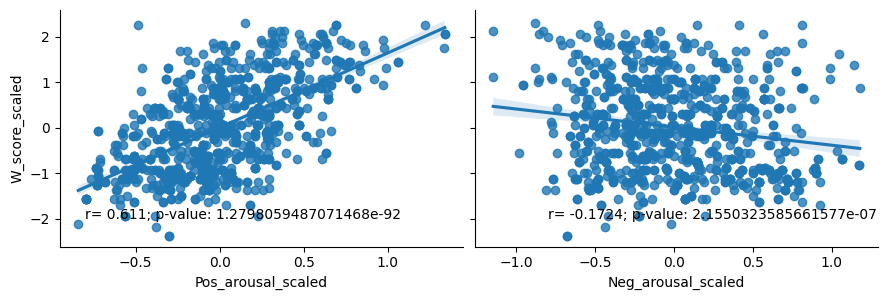

In [119]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for both types of trailers. 
W_PA_All_corr = pearsonr(all_subs_events_df["W_score_scaled"], all_subs_events_df["Pos_arousal_scaled"])
W_NA_All_corr = pearsonr(all_subs_events_df["W_score_scaled"], all_subs_events_df["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal is: " + str(round(W_PA_All_corr[0], 4)) + " with a p-value of: " + str((W_PA_All_corr[1])))
print("The correlation between W_score and Neg_arousal is: " + str(round(W_NA_All_corr[0], 4)) + " with a p-value of: " + str((W_NA_All_corr[1])))

W_PA_NA_behavioral_plot = sns.pairplot(
    all_subs_events_df,
    kind="reg",
    x_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"],
    y_vars=["W_score_scaled"], 
    palette="crest",
    height=3,
    aspect=1.5)

# Add annotation to the plot. 
W_PA_string = "r= " + str(round(W_PA_All_corr[0], 4)) + "; p-value: " + str((W_PA_All_corr[1]))
W_PA_NA_behavioral_plot.axes[0, 0].text(s=W_PA_string, x=-.8, y=-2, fontsize=10)
W_NA_string = "r= " + str(round(W_NA_All_corr[0], 4)) + "; p-value: " + str((W_NA_All_corr[1]))
W_PA_NA_behavioral_plot.axes[0, 1].text(s=W_NA_string, x=-.8, y=-2, fontsize=10)


In [120]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for comedy trailers.
W_PA_comedy_corr = pearsonr(all_subs_events_comedy["W_score_scaled"], all_subs_events_comedy["Pos_arousal_scaled"])
W_NA_comedy_corr = pearsonr(all_subs_events_comedy["W_score_scaled"], all_subs_events_comedy["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal for comedy trailers is: " + str(round(W_PA_comedy_corr[0], 4)) + " with a p-value of: " + str((W_PA_comedy_corr[1])))
print("The correlation between W_score and Neg_arousal for comedy trailers is: " + str(round(W_NA_comedy_corr[0], 4)) + " with a p-value of: " + str((W_NA_comedy_corr[1])))

# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for horror trailers.
W_PA_horror_corr = pearsonr(all_subs_events_horror["W_score_scaled"], all_subs_events_horror["Pos_arousal_scaled"])
W_NA_horror_corr = pearsonr(all_subs_events_horror["W_score_scaled"], all_subs_events_horror["Neg_arousal_scaled"])

print("\nThe correlation between W_score and Pos_arousal for horror trailers is: " + str(round(W_PA_horror_corr[0], 4)) + " with a p-value of: " + str((W_PA_horror_corr[1])))
print("The correlation between W_score and Neg_arousal for horror trailers is: " + str(round(W_NA_horror_corr[0], 4)) + " with a p-value of: " + str((W_NA_horror_corr[1])))


The correlation between W_score and Pos_arousal for comedy trailers is: 0.6478 with a p-value of: 6.618854071644288e-55
The correlation between W_score and Neg_arousal for comedy trailers is: 0.0003 with a p-value of: 0.9953939135800138

The correlation between W_score and Pos_arousal for horror trailers is: 0.4937 with a p-value of: 1.1736534121695747e-28
The correlation between W_score and Neg_arousal for horror trailers is: -0.0607 with a p-value of: 0.20168748929118413


Text(-0.8, -2.5, 'H r= 0.4937; p-value: 1.1736534121695747e-28')

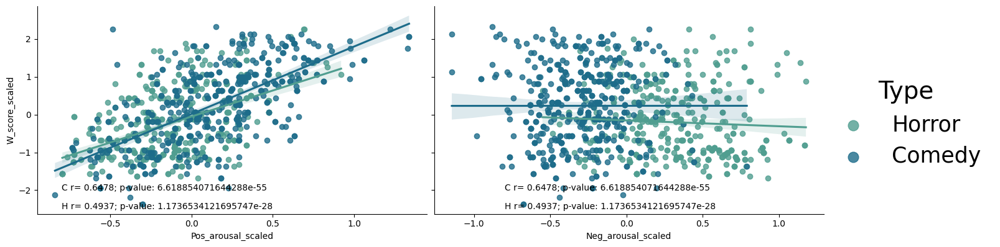

In [121]:
W_PA_NA_bothTrailers_behavioral_plot = sns.pairplot(
    all_subs_events_df,
    kind="reg",
    x_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"],
    y_vars=["W_score_scaled"], 
    palette="crest",
    hue="Type",
    height=4,
    aspect=1.7)

W_comedy_PA_string = "C r= " + str(round(W_PA_comedy_corr[0], 4)) + "; p-value: " + str((W_PA_comedy_corr[1]))
W_horror_PA_string = "H r= " + str(round(W_PA_horror_corr[0], 4)) + "; p-value: " + str((W_PA_horror_corr[1]))
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 0].text(s=W_comedy_PA_string, x=-.8, y=-2, fontsize=10)
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 0].text(s=W_horror_PA_string, x=-.8, y=-2.5, fontsize=10)

W_comedy_NA_string = "C r= " + str(round(W_PA_comedy_corr[0], 4)) + "; p-value: " + str((W_PA_comedy_corr[1]))
W_horror_NA_string = "H r= " + str(round(W_PA_horror_corr[0], 4)) + "; p-value: " + str((W_PA_horror_corr[1]))
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 1].text(s=W_comedy_NA_string, x=-.8, y=-2, fontsize=10)
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 1].text(s=W_horror_NA_string, x=-.8, y=-2.5, fontsize=10)

<Axes: xlabel='Type', ylabel='Neg_arousal_scaled'>

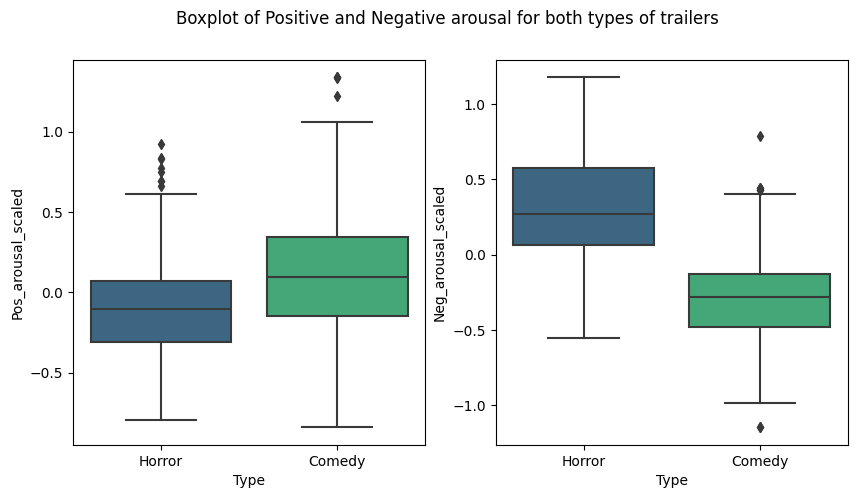

In [122]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5), sharex=True)
fig.suptitle("Boxplot of Positive and Negative arousal for both types of trailers")
sns.boxplot(data=all_subs_events_df, y="Pos_arousal_scaled", x="Type", palette="viridis", ax=axs[0])
sns.boxplot(data=all_subs_events_df, y="Neg_arousal_scaled", x="Type", palette="viridis", ax=axs[1])


<Axes: xlabel='Pos_arousal_scaled', ylabel='Count'>

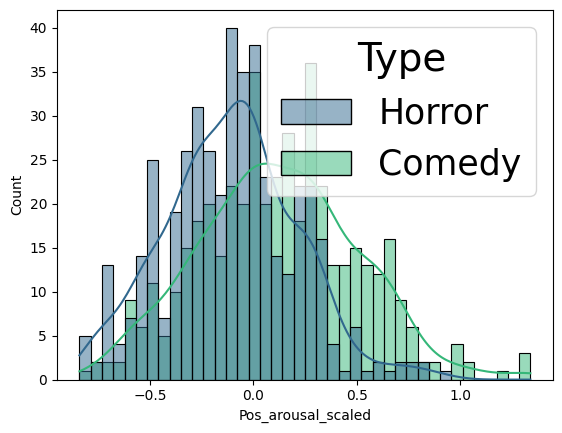

In [123]:
sns.histplot(data=all_subs_events_df, x="Pos_arousal_scaled", hue="Type", kde=True, palette="viridis", bins=40)
#sns.histplot(data=all_subs_events_df, x="Neg_arousal_scaled", hue="Type", kde=True, palette="viridis", bins=40)



<Axes: xlabel='W_score_scaled', ylabel='Count'>

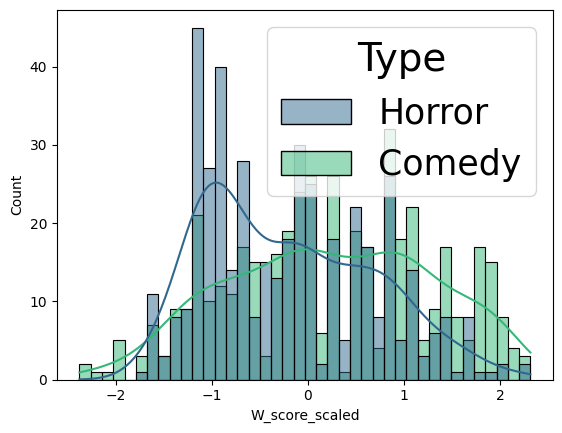

In [124]:
sns.histplot(data=all_subs_events_df, x="W_score_scaled", hue="Type", kde=True, palette="viridis", bins=40)

In [125]:
#sns.displot(data=all_subs_events_df, x="W_score", row="Trailer", kde=True, palette="viridis")

## Neural Activation Whole Average 

The correlation between NAcc_whole activation and positive arousal is: 0.00986 with a p-value of: 0.7685050620872651
The correlation between AIns_whole activation and positive arousal is: -0.02649 with a p-value of: 0.4289087921313418
The correlation between MPFC_whole activation and positive arousal is: -0.00876 with a p-value of: 0.7936992804343275

The correlation between NAcc_whole activation and negative arousal is: 0.05581 with a p-value of: 0.0953793489431507
The correlation between AIns_whole activation and negative arousal is: 0.24419 with a p-value of: 1.32892563577949e-13
The correlation between MPFC_whole activation and negative arousal is: -0.01471 with a p-value of: 0.6605253135771725

The correlation between NAcc_whole activation and watch scores is: 0.01484 with a p-value of: 0.6577716475520771
The correlation between AIns_whole activation and watch scores is: -0.03953 with a p-value of: 0.23775631771013545
The correlation between MPFC_whole activation and watch scores 

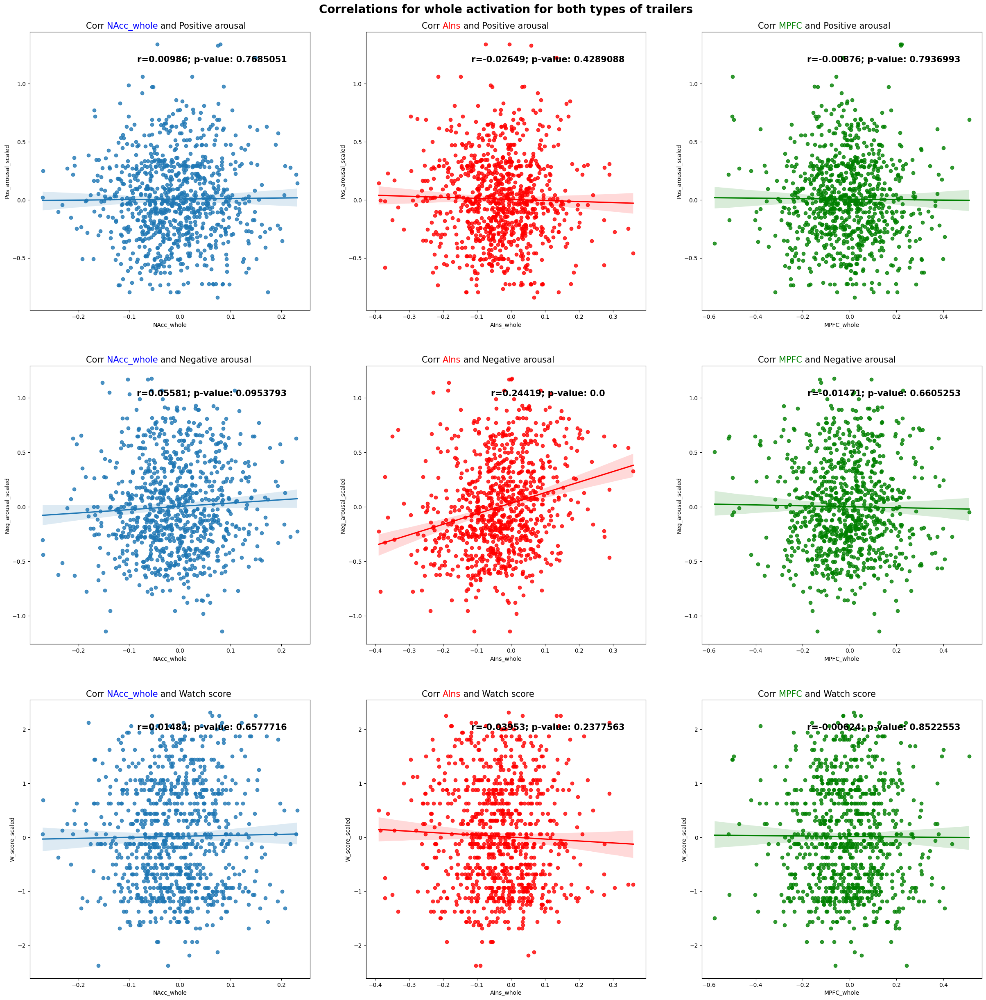

In [126]:
test_title = "Correlations for whole activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_df, "whole", test_title)

The correlation between NAcc_whole activation and positive arousal for Comedy trailers is: 0.0561 with a p-value of: 0.23499878402022248
The correlation between AIns_whole activation and positive arousal for Comedy trailers is: 0.11944 with a p-value of: 0.011222595283164301
The correlation between MPFC_whole activation and positive arousal for Comedy trailers is: -0.02307 with a p-value of: 0.6255173687351196

The correlation between NAcc_whole activation and negative arousal for Comedy trailers is: 0.03394 with a p-value of: 0.4726157979231497
The correlation between AIns_whole activation and negative arousal for Comedy trailers is: 0.05495 with a p-value of: 0.24471156120040424
The correlation between MPFC_whole activation and negative arousal for Comedy trailers is: 0.00362 with a p-value of: 0.939025314922986

The correlation between NAcc_whole activation and watch scores for Comedy trailers is: 0.07151 with a p-value of: 0.1298373534622478
The correlation between AIns_whole activ

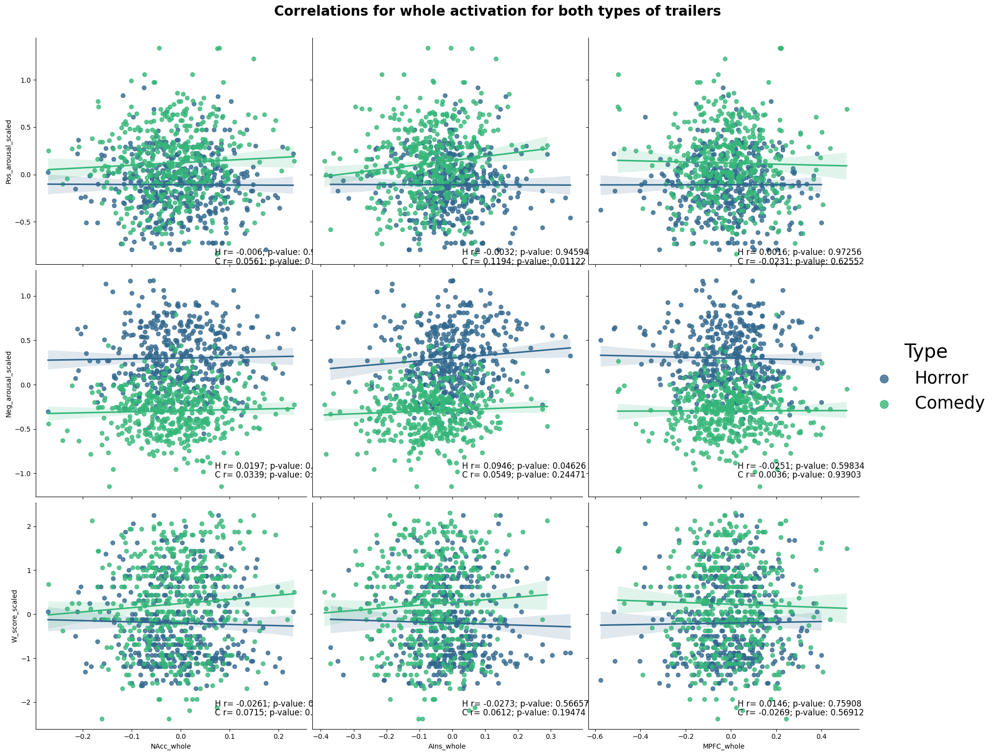

In [127]:

compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "whole", "Correlations for whole activation for both types of trailers")


## Neural Activation Offset 

The correlation between NAcc_offset activation and positive arousal is: 0.0054 with a p-value of: 0.8720062738909821
The correlation between AIns_offset activation and positive arousal is: -0.04059 with a p-value of: 0.22529883183416907
The correlation between MPFC_offset activation and positive arousal is: 0.00561 with a p-value of: 0.8669836935281343

The correlation between NAcc_offset activation and negative arousal is: 0.00482 with a p-value of: 0.885664966731578
The correlation between AIns_offset activation and negative arousal is: 0.17083 with a p-value of: 2.77053547155313e-07
The correlation between MPFC_offset activation and negative arousal is: -0.04074 with a p-value of: 0.22361491924433813

The correlation between NAcc_offset activation and watch scores is: 0.0193 with a p-value of: 0.5643201618310403
The correlation between AIns_offset activation and watch scores is: -0.06325 with a p-value of: 0.058719818225918416
The correlation between MPFC_offset activation and watch

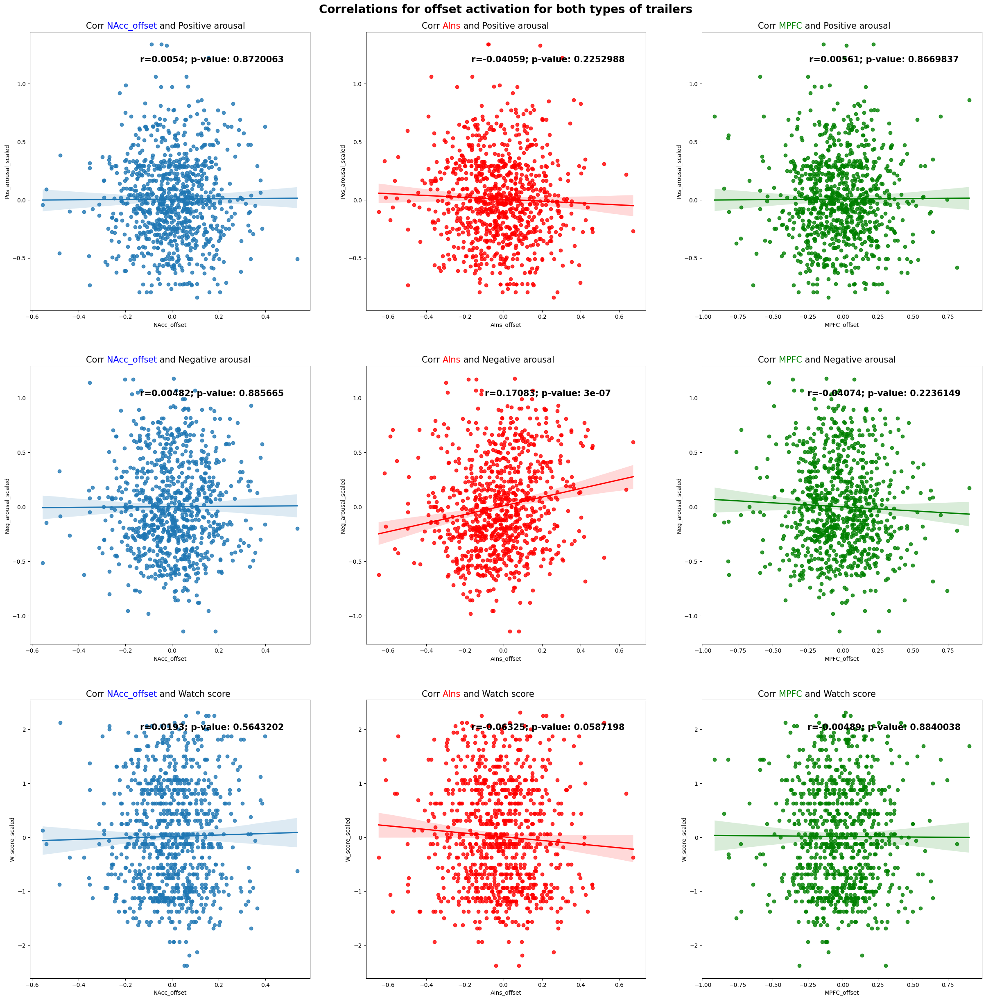

In [128]:
offset_title = "Correlations for offset activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_df, "offset", offset_title)

The correlation between NAcc_offset activation and positive arousal for Comedy trailers is: -0.03198 with a p-value of: 0.4985822522275533
The correlation between AIns_offset activation and positive arousal for Comedy trailers is: 0.04383 with a p-value of: 0.3535890985145786
The correlation between MPFC_offset activation and positive arousal for Comedy trailers is: 0.0178 with a p-value of: 0.7064235353175438

The correlation between NAcc_offset activation and negative arousal for Comedy trailers is: -0.00505 with a p-value of: 0.9149918901301309
The correlation between AIns_offset activation and negative arousal for Comedy trailers is: 0.01203 with a p-value of: 0.7990898130105932
The correlation between MPFC_offset activation and negative arousal for Comedy trailers is: -0.02256 with a p-value of: 0.6331796917963883

The correlation between NAcc_offset activation and watch scores for Comedy trailers is: -0.01682 with a p-value of: 0.7219700188245467
The correlation between AIns_offs

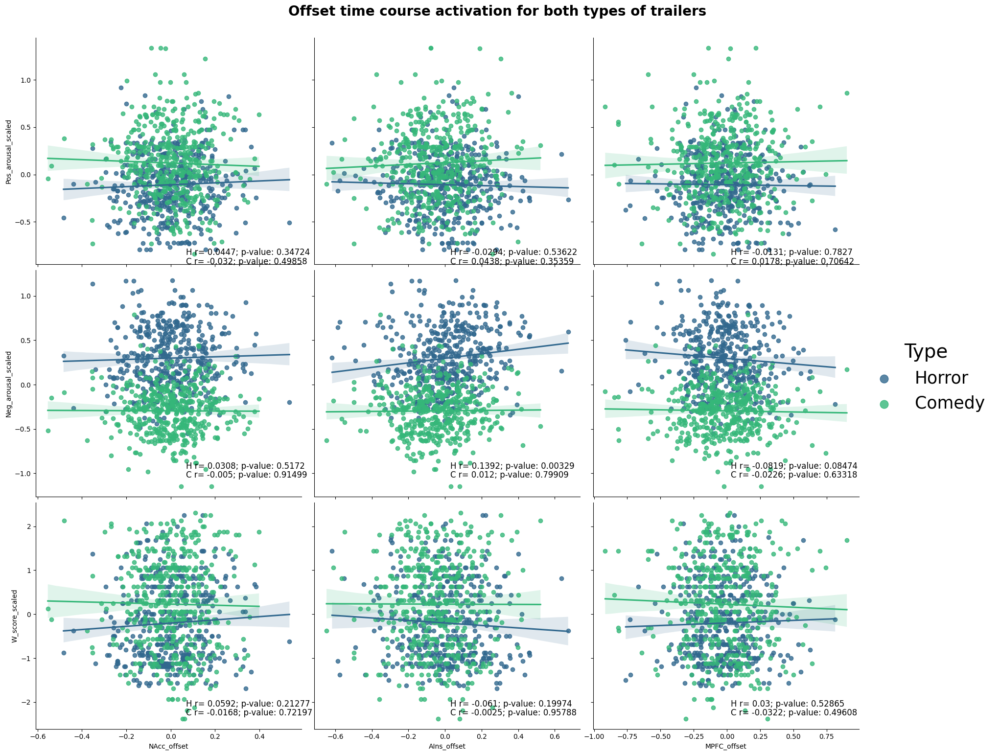

In [129]:
offset_title = 'Offset time course activation for both types of trailers'
compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "offset", offset_title)


# Neural activation middle

The correlation between NAcc_middle activation and positive arousal is: -0.04663 with a p-value of: 0.1635745498518563
The correlation between AIns_middle activation and positive arousal is: -0.04358 with a p-value of: 0.19296322369712518
The correlation between MPFC_middle activation and positive arousal is: -0.04588 with a p-value of: 0.17052706339274487

The correlation between NAcc_middle activation and negative arousal is: 0.0534 with a p-value of: 0.11062017923784499
The correlation between AIns_middle activation and negative arousal is: 0.18525 with a p-value of: 2.4130437170501077e-08
The correlation between MPFC_middle activation and negative arousal is: -0.00248 with a p-value of: 0.9409781279367638

The correlation between NAcc_middle activation and watch scores is: -0.0124 with a p-value of: 0.7111301223475581
The correlation between AIns_middle activation and watch scores is: -0.01757 with a p-value of: 0.5998795819460798
The correlation between MPFC_middle activation and 

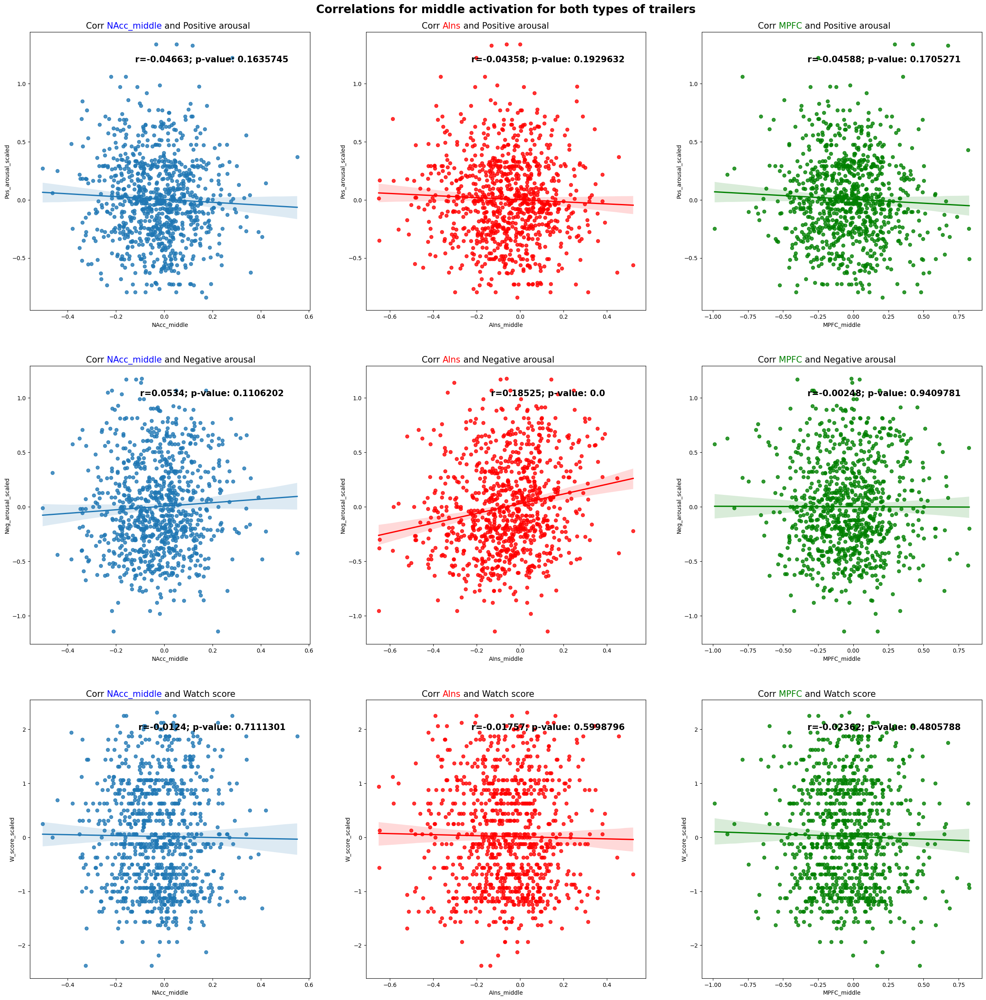

In [130]:
middle_title = "Correlations for middle activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_df, "middle", middle_title)

The correlation between NAcc_middle activation and positive arousal for Comedy trailers is: -0.01243 with a p-value of: 0.7925234365229121
The correlation between AIns_middle activation and positive arousal for Comedy trailers is: 0.05547 with a p-value of: 0.24024720097951105
The correlation between MPFC_middle activation and positive arousal for Comedy trailers is: -0.05854 with a p-value of: 0.21518638413623054

The correlation between NAcc_middle activation and negative arousal for Comedy trailers is: -0.00349 with a p-value of: 0.9411310270232854
The correlation between AIns_middle activation and negative arousal for Comedy trailers is: 0.03731 with a p-value of: 0.4297581635008058
The correlation between MPFC_middle activation and negative arousal for Comedy trailers is: -0.04098 with a p-value of: 0.3858471542852528

The correlation between NAcc_middle activation and watch scores for Comedy trailers is: 0.03942 with a p-value of: 0.40419963281146676
The correlation between AIns_

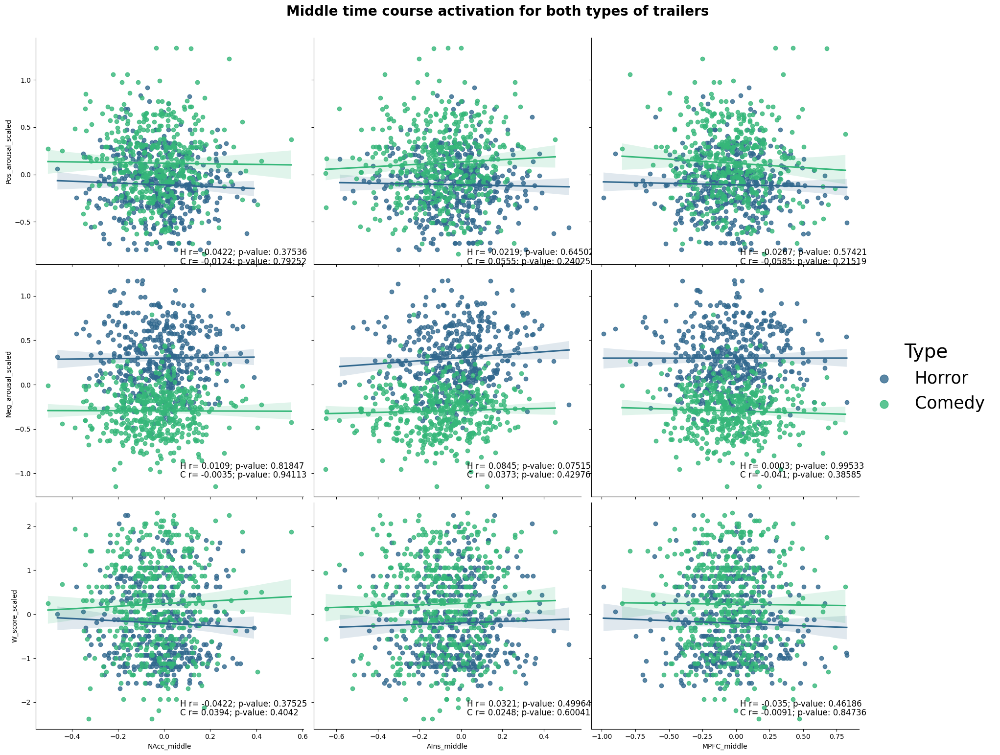

In [131]:
middle_title = 'Middle time course activation for both types of trailers'
compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "middle", middle_title)

## Neural activation onset

The correlation between NAcc_onset activation and positive arousal is: 0.05341 with a p-value of: 0.11049830183040336
The correlation between AIns_onset activation and positive arousal is: 0.03818 with a p-value of: 0.25407395261942156
The correlation between MPFC_onset activation and positive arousal is: 0.0253 with a p-value of: 0.4499616146464692

The correlation between NAcc_onset activation and negative arousal is: 0.03314 with a p-value of: 0.3222838215575361
The correlation between AIns_onset activation and negative arousal is: 0.08419 with a p-value of: 0.011790259422808003
The correlation between MPFC_onset activation and negative arousal is: 0.01405 with a p-value of: 0.6748871549292886

The correlation between NAcc_onset activation and watch scores is: 0.01683 with a p-value of: 0.6152865559308042
The correlation between AIns_onset activation and watch scores is: 0.01133 with a p-value of: 0.7351015273468302
The correlation between MPFC_onset activation and watch scores is: 

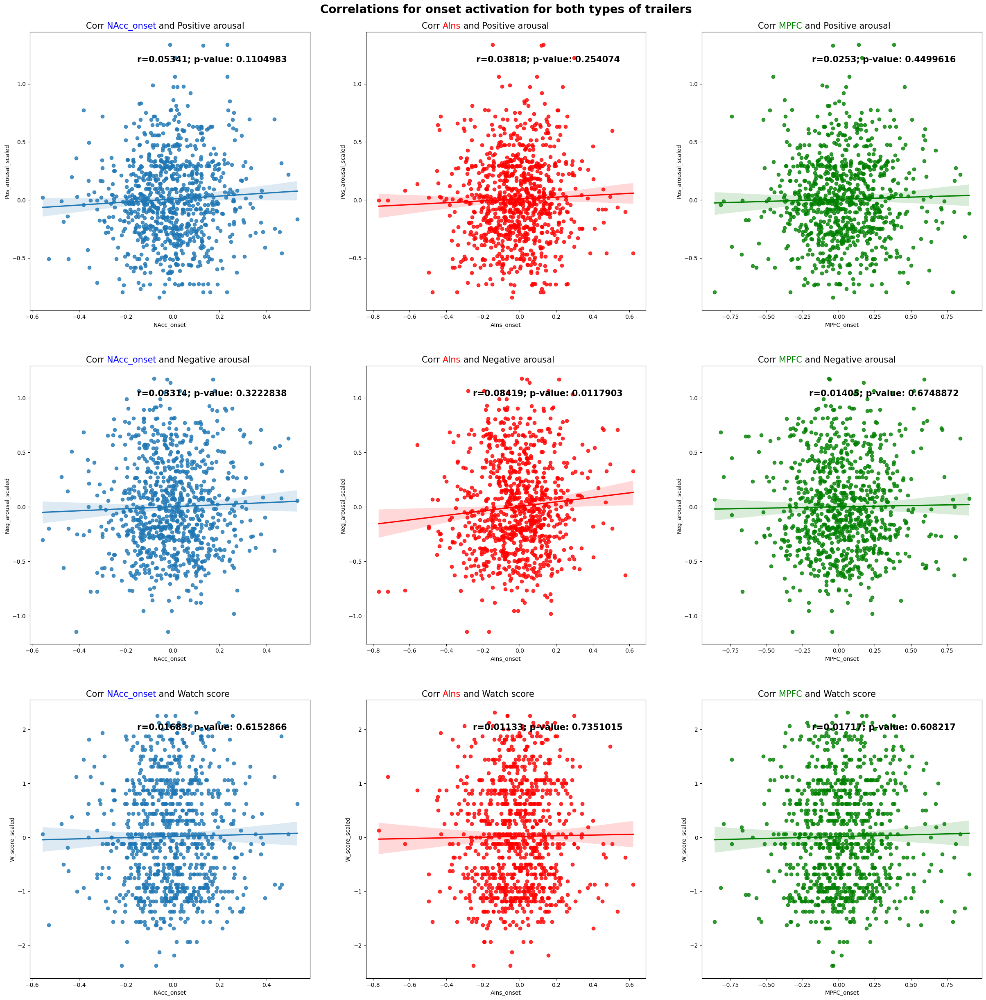

In [132]:
onset_title = "Correlations for onset activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_df, "onset", onset_title)

The correlation between NAcc_onset activation and positive arousal for Comedy trailers is: 0.13176 with a p-value of: 0.005118638454537243
The correlation between AIns_onset activation and positive arousal for Comedy trailers is: 0.11283 with a p-value of: 0.016644210485733404
The correlation between MPFC_onset activation and positive arousal for Comedy trailers is: -0.00176 with a p-value of: 0.9702674869648279

The correlation between NAcc_onset activation and negative arousal for Comedy trailers is: 0.06242 with a p-value of: 0.1862240029529642
The correlation between AIns_onset activation and negative arousal for Comedy trailers is: 0.04829 with a p-value of: 0.3067428419919564
The correlation between MPFC_onset activation and negative arousal for Comedy trailers is: 0.07029 with a p-value of: 0.13654574283025891

The correlation between NAcc_onset activation and watch scores for Comedy trailers is: 0.0919 with a p-value of: 0.05139343776152068
The correlation between AIns_onset ac

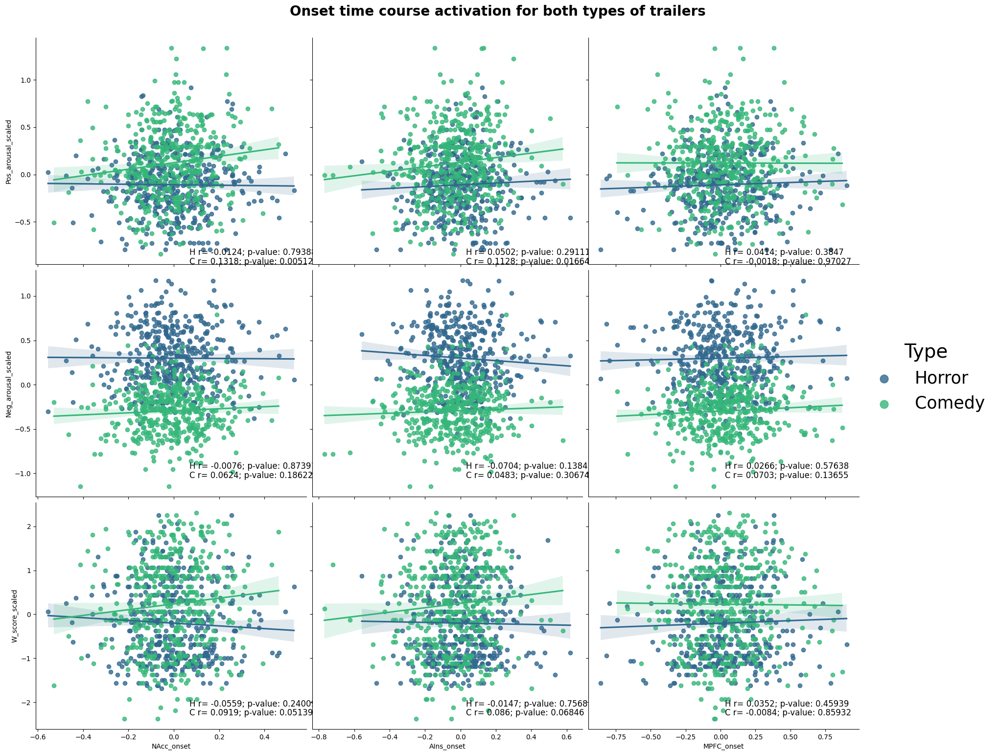

In [133]:
onset_title = 'Onset time course activation for both types of trailers'
compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "onset", onset_title)

## Peak Max

The correlation between NAcc_pos_peak activation and positive arousal is: 0.01521 with a p-value of: 0.6496121153053488
The correlation between AIns_pos_peak activation and positive arousal is: -0.00895 with a p-value of: 0.7892692985269913
The correlation between MPFC_pos_peak activation and positive arousal is: 0.01349 with a p-value of: 0.6871226961471074

The correlation between NAcc_pos_peak activation and negative arousal is: 0.05929 with a p-value of: 0.07641843173637126
The correlation between AIns_pos_peak activation and negative arousal is: 0.13802 with a p-value of: 3.460193169774992e-05
The correlation between MPFC_pos_peak activation and negative arousal is: 0.00251 with a p-value of: 0.9403447380402354

The correlation between NAcc_pos_peak activation and watch scores is: -0.00553 with a p-value of: 0.8687585738107722
The correlation between AIns_pos_peak activation and watch scores is: -0.02878 with a p-value of: 0.3900463447968581
The correlation between MPFC_pos_peak a

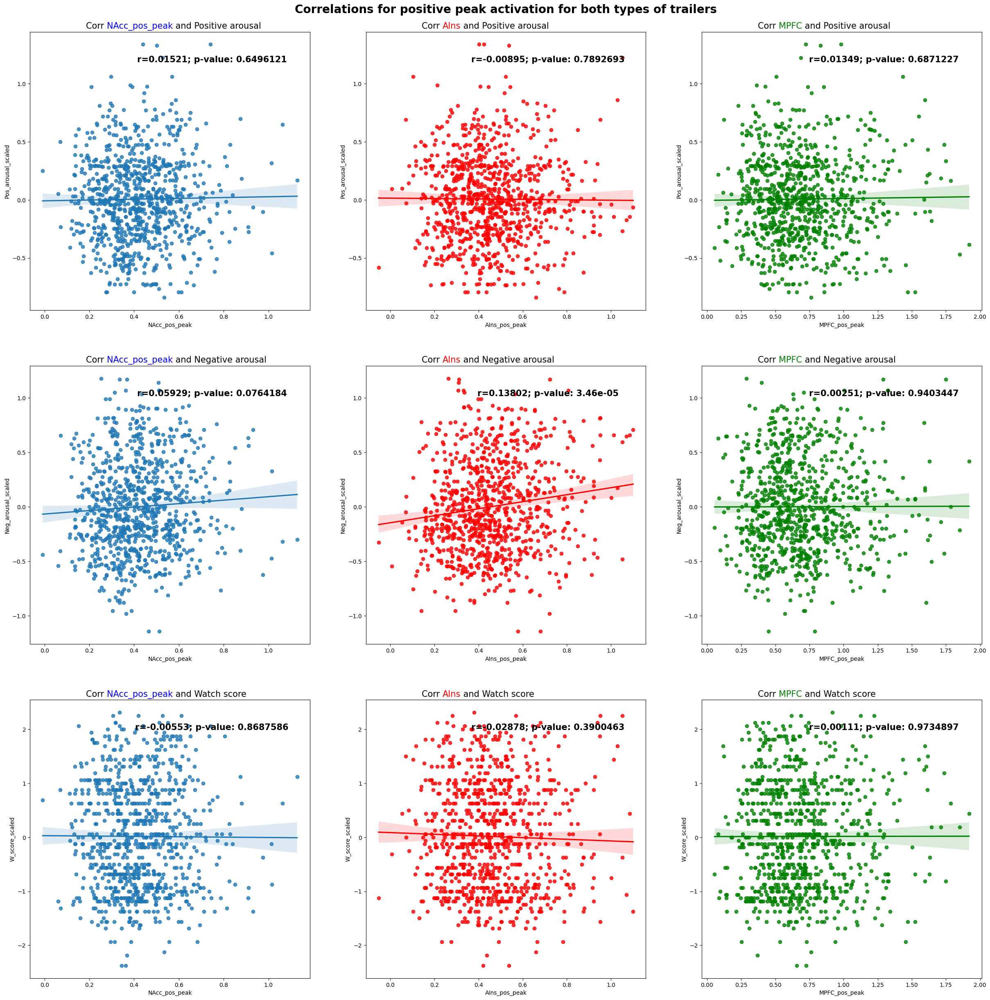

In [134]:
pos_peak_title = "Correlations for positive peak activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_df, "pos_peak", pos_peak_title)

The correlation between NAcc_pos_peak activation and positive arousal for Comedy trailers is: 0.06786 with a p-value of: 0.1506429494597752
The correlation between AIns_pos_peak activation and positive arousal for Comedy trailers is: 0.00882 with a p-value of: 0.8520260759270907
The correlation between MPFC_pos_peak activation and positive arousal for Comedy trailers is: 0.00084 with a p-value of: 0.9858421483341756

The correlation between NAcc_pos_peak activation and negative arousal for Comedy trailers is: 0.04005 with a p-value of: 0.3966945767811078
The correlation between AIns_pos_peak activation and negative arousal for Comedy trailers is: -0.0051 with a p-value of: 0.9141115327901985
The correlation between MPFC_pos_peak activation and negative arousal for Comedy trailers is: 0.04589 with a p-value of: 0.3313841963887326

The correlation between NAcc_pos_peak activation and watch scores for Comedy trailers is: 0.05731 with a p-value of: 0.22498668688097684
The correlation betwe

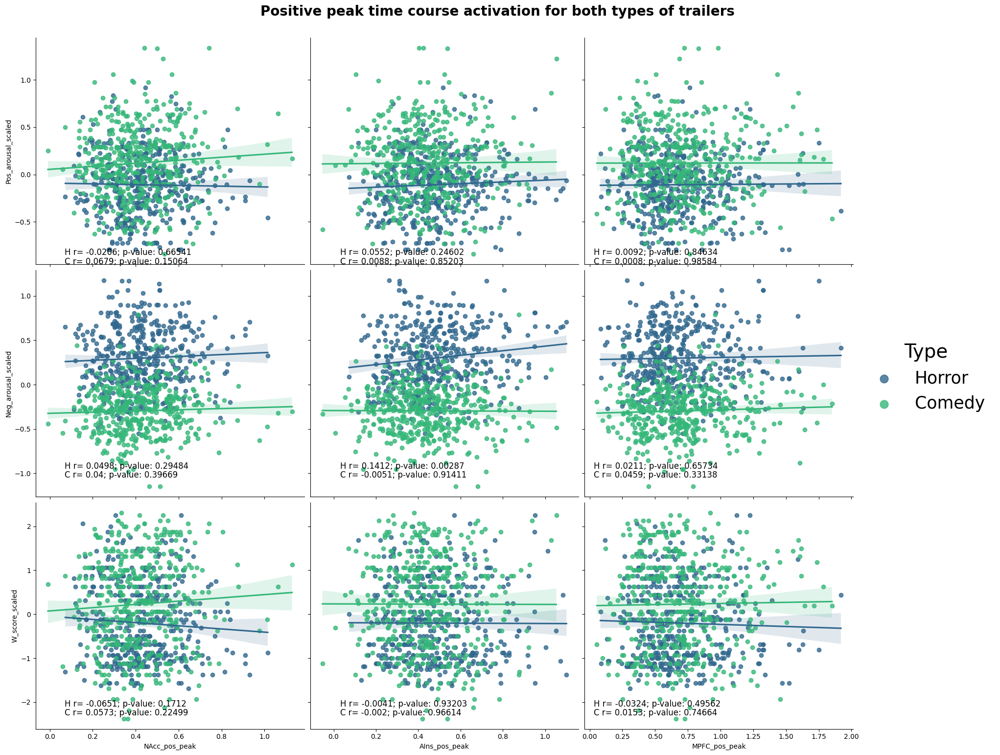

In [135]:
pos_peak_title = 'Positive peak time course activation for both types of trailers'
compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "pos_peak", pos_peak_title)

## Peak min

The correlation between NAcc_neg_peak activation and positive arousal is: 0.01769 with a p-value of: 0.5973044468764936
The correlation between AIns_neg_peak activation and positive arousal is: -0.0429 with a p-value of: 0.20001547714330042
The correlation between MPFC_neg_peak activation and positive arousal is: 0.0275 with a p-value of: 0.4114623732902328

The correlation between NAcc_neg_peak activation and negative arousal is: 0.00078 with a p-value of: 0.9814376548482947
The correlation between AIns_neg_peak activation and negative arousal is: 0.1648 with a p-value of: 7.249965099610303e-07
The correlation between MPFC_neg_peak activation and negative arousal is: 0.0006 with a p-value of: 0.9856090934191127

The correlation between NAcc_neg_peak activation and watch scores is: 0.01485 with a p-value of: 0.6573872090185061
The correlation between AIns_neg_peak activation and watch scores is: -0.05268 with a p-value of: 0.11548050418465945
The correlation between MPFC_neg_peak activ

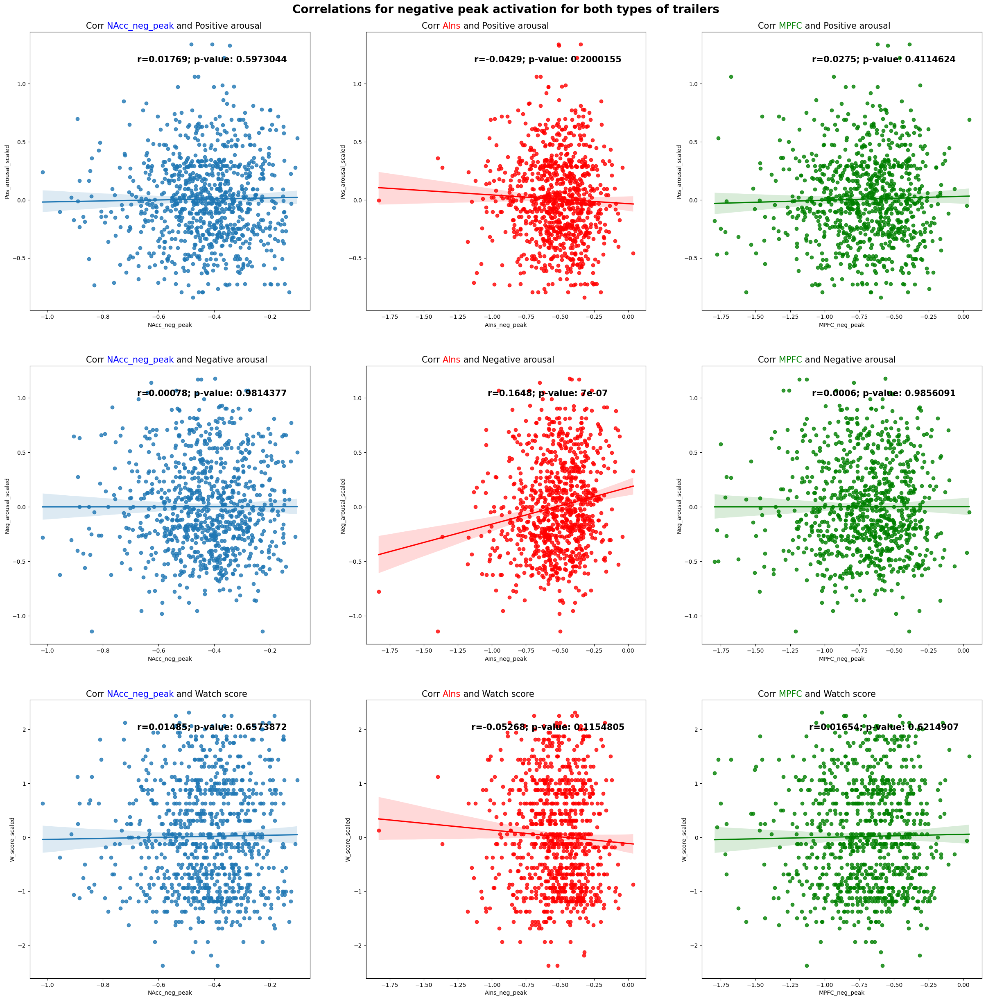

In [136]:
neg_peak_title = "Correlations for negative peak activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_df, "neg_peak", neg_peak_title)

The correlation between NAcc_neg_peak activation and positive arousal for Comedy trailers is: 0.05004 with a p-value of: 0.289546806869808
The correlation between AIns_neg_peak activation and positive arousal for Comedy trailers is: 0.10167 with a p-value of: 0.031059815745229157
The correlation between MPFC_neg_peak activation and positive arousal for Comedy trailers is: 0.03148 with a p-value of: 0.50538234498074

The correlation between NAcc_neg_peak activation and negative arousal for Comedy trailers is: 0.03924 with a p-value of: 0.40634655191169816
The correlation between AIns_neg_peak activation and negative arousal for Comedy trailers is: 0.07945 with a p-value of: 0.09229208881204315
The correlation between MPFC_neg_peak activation and negative arousal for Comedy trailers is: -0.00999 with a p-value of: 0.8326603751260374

The correlation between NAcc_neg_peak activation and watch scores for Comedy trailers is: 0.0163 with a p-value of: 0.7302133146881061
The correlation betwe

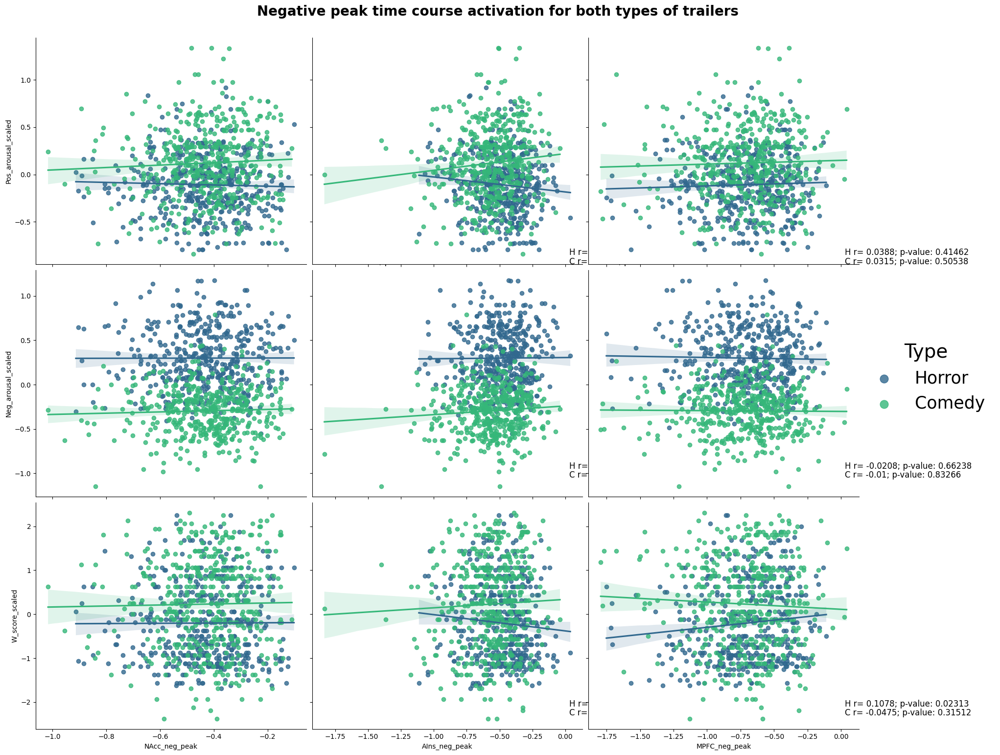

In [137]:
neg_peak_title = 'Negative peak time course activation for both types of trailers'
compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "neg_peak", neg_peak_title)

## Positive peak (slope) 

The correlation between NAcc_slope_peak activation and positive arousal is: 0.0475 with a p-value of: 0.31037578296536344
The correlation between AIns_slope_peak activation and positive arousal is: 0.0266 with a p-value of: 0.5701329219579051
The correlation between MPFC_slope_peak activation and positive arousal is: -0.04777 with a p-value of: 0.3076497879654951

The correlation between NAcc_slope_peak activation and negative arousal is: 0.06578 with a p-value of: 0.15986507580720724
The correlation between AIns_slope_peak activation and negative arousal is: 0.05843 with a p-value of: 0.21201882782848766
The correlation between MPFC_slope_peak activation and negative arousal is: 0.01619 with a p-value of: 0.7296920479769748

The correlation between NAcc_slope_peak activation and watch scores is: -0.00657 with a p-value of: 0.8884667581650976
The correlation between AIns_slope_peak activation and watch scores is: 0.05995 with a p-value of: 0.20032026375826412
The correlation between MP

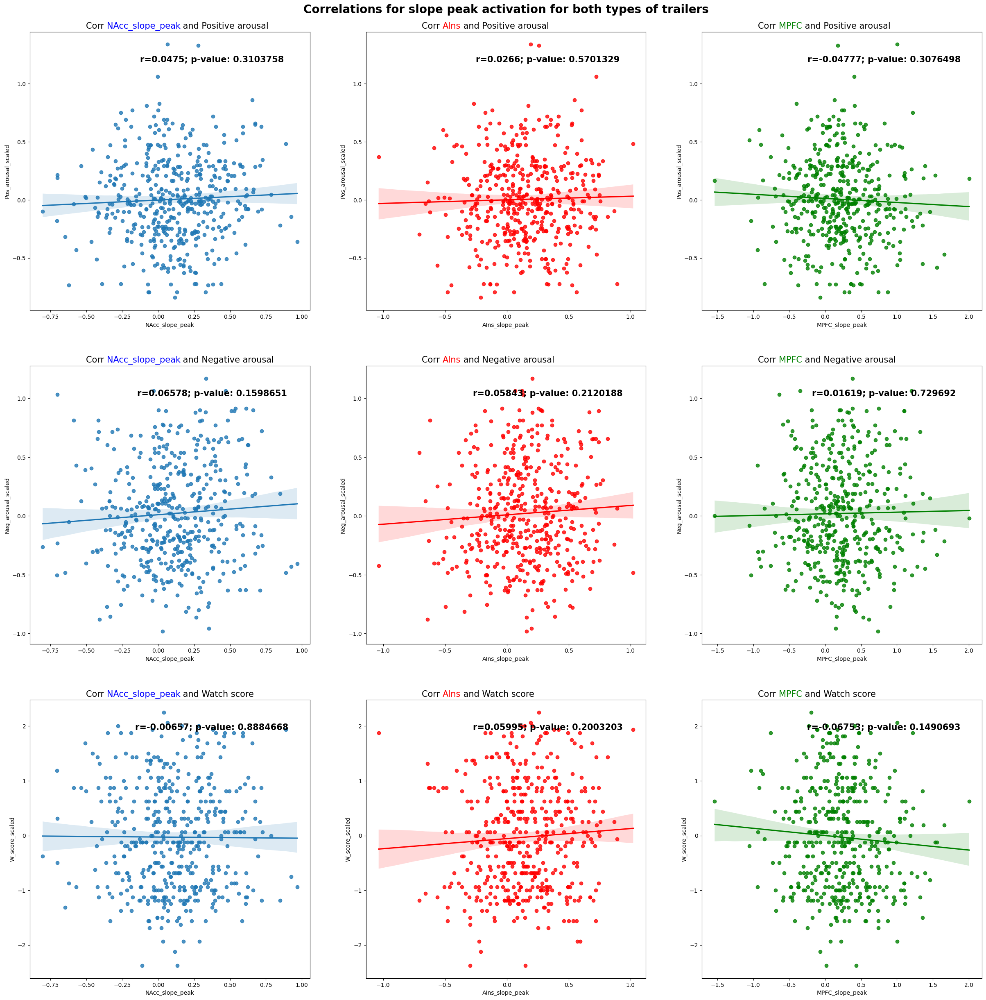

In [138]:
# Drop outliers from delta peaks.
all_subs_events_slope_df = all_subs_events_df[(all_subs_events_df["NAcc_slope_peak"] != 0) & (all_subs_events_df["AIns_slope_peak"] != 0) & (all_subs_events_df["MPFC_slope_peak"] != 0)]
all_subs_events_slope_horror_df = all_subs_events_slope_df[all_subs_events_slope_df["Type"] == "Horror"]
all_subs_events_slope_comedy_df = all_subs_events_slope_df[all_subs_events_slope_df["Type"] == "Comedy"]


pos_slope_peak_title = "Correlations for slope peak activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_slope_df, "slope_peak", pos_slope_peak_title)

The correlation between NAcc_slope_peak activation and positive arousal for Comedy trailers is: 0.10648 with a p-value of: 0.1136392469801097
The correlation between AIns_slope_peak activation and positive arousal for Comedy trailers is: 0.0271 with a p-value of: 0.6880432083300936
The correlation between MPFC_slope_peak activation and positive arousal for Comedy trailers is: -0.02686 with a p-value of: 0.6906232760685248

The correlation between NAcc_slope_peak activation and negative arousal for Comedy trailers is: -0.00183 with a p-value of: 0.978344499697706
The correlation between AIns_slope_peak activation and negative arousal for Comedy trailers is: 0.07394 with a p-value of: 0.2726697171109175
The correlation between MPFC_slope_peak activation and negative arousal for Comedy trailers is: -0.04052 with a p-value of: 0.5481227316247272

The correlation between NAcc_slope_peak activation and watch scores for Comedy trailers is: 0.07381 with a p-value of: 0.27353296973023855
The co

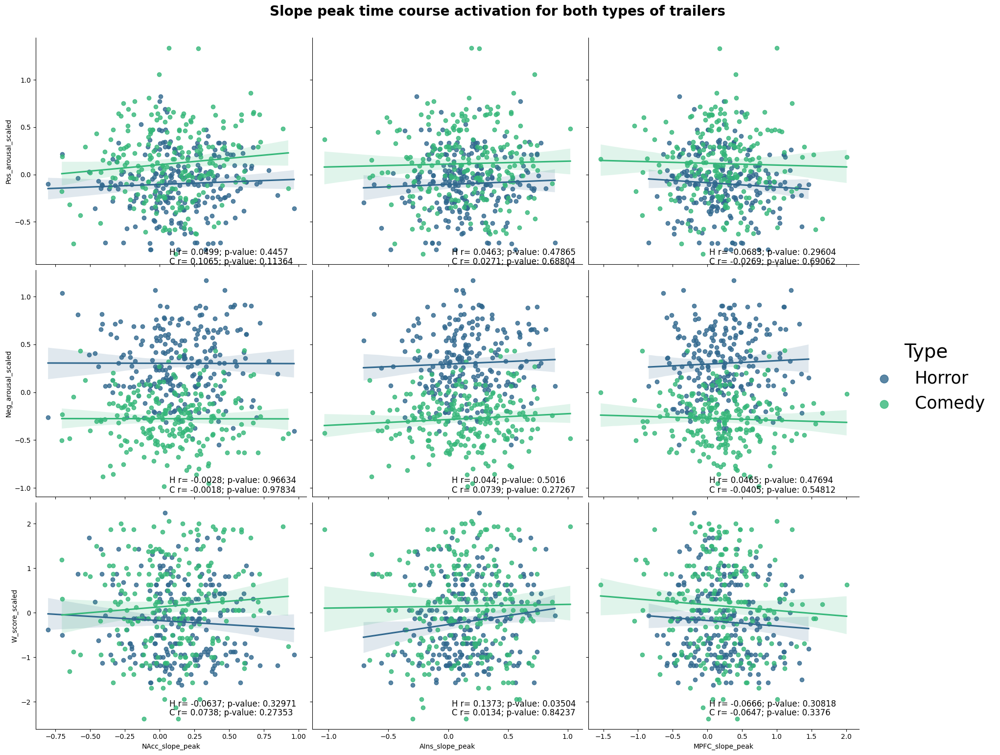

In [139]:
pos_slope_peak_title = 'Slope peak time course activation for both types of trailers'
compute_and_plot_both_corrs(all_subs_events_slope_df, all_subs_events_slope_comedy_df, all_subs_events_slope_horror_df, "slope_peak", pos_slope_peak_title)


## Narrow slope peak 

In [140]:
#narrow_slope_peak_title = "Correlations for narrow slope peak activation for both types of trailers"
#compute_and_plot_corrs(all_subs_events_df, "narrow_slope_peak", narrow_slope_peak_title)

In [141]:
#narrow_slope_peak_title = 'Narrow slope peak time course activation for both types of trailers'
#compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "narrow_slope_peak", narrow_slope_peak_title)

## Positive peak (delta)

In [142]:
#delta_peak_title = "Correlations for delta peak activation for both types of trailers"
#compute_and_plot_corrs(all_subs_events_df, "delta_peak", delta_peak_title)

In [143]:
#delta_peak_title = 'Delta peak time course activation for both types of trailers'
#compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "delta_peak", delta_peak_title)

## Narrow delta peak 

In [144]:
#narrow_delta_peak_title = "Correlations for narrow delta peak activation for both types of trailers"
#compute_and_plot_corrs(all_subs_events_df, "narrow_delta_peak", narrow_delta_peak_title)

In [145]:
#narrow_delta_peak_title = 'Narrow delta peak time course activation for both types of trailers'
#compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "narrow_delta_peak", narrow_delta_peak_title)

## Neural ISC

In [146]:
# Correlation with Positive Arousal.
NAcc_PA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["W_score_scaled"])
AIns_W_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["W_score_scaled"])
MPFC_W_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_All_corr[1])))


For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: 0.02926 with a p-value of: 0.38229045879889084
For both types of trailers, the correlation between AIns ISC activation and positive arousal is: 0.04385 with a p-value of: 0.19025531976941804
For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: 0.07933 with a p-value of: 0.017673663980875852

For both types of trailers, the correlation between NAcc ISC activation and negative arousal is: -0.00238 with a p-value of: 0.943283598961496
For both types of trailers, the correlation between AIns ISC activation and negative arousal is: -0.00186 with a p-value of: 0.9558132125872548
For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: 0.02532 with a p-value of: 0.4496186661381916

For both types of trailers, the correlation between NAcc ISC activation and watch scores is: 0.08194 with a p-value of: 0.0142585094359

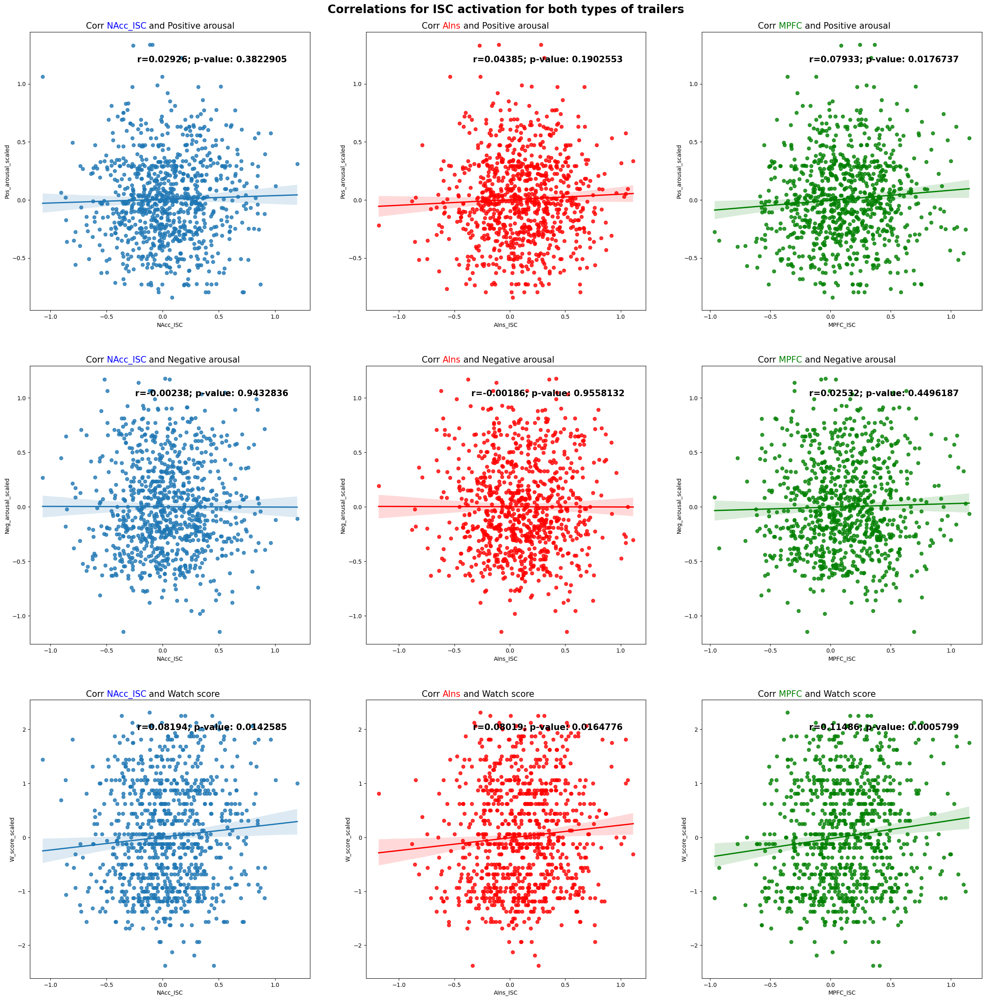

In [147]:
ISC_all_corr = [NAcc_PA_ISC_All_corr, NAcc_NA_ISC_All_corr, NAcc_W_ISC_All_corr, AIns_PA_ISC_All_corr, AIns_NA_ISC_All_corr, AIns_W_ISC_All_corr, MPFC_PA_ISC_All_corr, MPFC_NA_ISC_All_corr, MPFC_W_ISC_All_corr]
plot_correlations(all_subs_events_df, ISC_all_corr, "ISC", "Correlations for ISC activation for both types of trailers")


In [148]:
# ISC Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["W_score_scaled"])
AIns_W_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_C_corr[1])))


For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: 0.13071 with a p-value of: 0.005485811029864674
For comedy trailers, the correlation between AIns ISC activation and positive arousal is: 0.07952 with a p-value of: 0.09202229345527287
For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: 0.11752 with a p-value of: 0.012607426216716136

For comedy trailers, the correlation between NAcc ISC activation and negative arousal is: 0.00358 with a p-value of: 0.9396924174080754
For comedy trailers, the correlation between AIns ISC activation and negative arousal is: -0.00519 with a p-value of: 0.9125445041008847
For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: 0.01986 with a p-value of: 0.6743174181396375

For comedy trailers, the correlation between NAcc ISC activation and watch scores is: 0.14425 with a p-value of: 0.0021582723837002054
For comedy trailers, the correlation betw

In [149]:
# ISC Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["W_score_scaled"])
AIns_W_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["W_score_scaled"])
MPFC_W_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_H_corr[1])))



For horror trailers, the correlation between NAcc ISC activation and positive arousal is: -0.08353 with a p-value of: 0.07872025349970395
For horror trailers, the correlation between AIns ISC activation and positive arousal is: -0.01656 with a p-value of: 0.7279219536648753
For horror trailers, the correlation between MPFC ISC activation and positive arousal is: 0.02964 with a p-value of: 0.5332842874675234

For horror trailers, the correlation between NAcc ISC activation and negative arousal is: -0.04567 with a p-value of: 0.3369813368040712
For horror trailers, the correlation between AIns ISC activation and negative arousal is: 0.05738 with a p-value of: 0.2275810100073974
For horror trailers, the correlation between MPFC ISC activation and negative arousal is: 0.07591 with a p-value of: 0.11021522416772193

For horror trailers, the correlation between NAcc ISC activation and watch scores is: 0.0173 with a p-value of: 0.7162712097278914
For horror trailers, the correlation between A

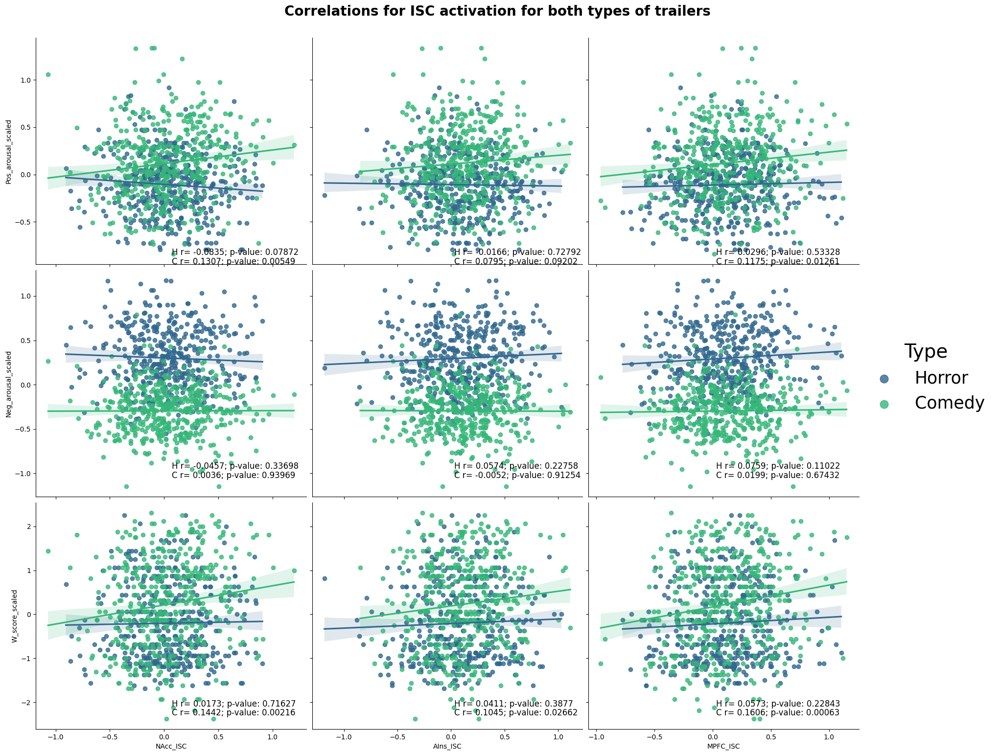

In [150]:
ISC_comedy_corr = [NAcc_PA_ISC_C_corr, NAcc_NA_ISC_C_corr, NAcc_W_ISC_C_corr, AIns_PA_ISC_C_corr, AIns_NA_ISC_C_corr, AIns_W_ISC_C_corr, MPFC_PA_ISC_C_corr, MPFC_NA_ISC_C_corr, MPFC_W_ISC_C_corr]
ISC_horror_corr = [NAcc_PA_ISC_H_corr, NAcc_NA_ISC_H_corr, NAcc_W_ISC_H_corr, AIns_PA_ISC_H_corr, AIns_NA_ISC_H_corr, AIns_W_ISC_H_corr, MPFC_PA_ISC_H_corr, MPFC_NA_ISC_H_corr, MPFC_W_ISC_H_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "ISC", ISC_comedy_corr, ISC_horror_corr, "Correlations for ISC activation for both types of trailers")


In [151]:
# Open a datasets directory. 
fd = os.open("/Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData", os.O_RDONLY)


# Use os.fchdir() method to change the current dir/folder.
os.fchdir(fd)

# Safe check- Print current working directory
print("Current working dir : %s" % os.getcwd())

root_path = os.getcwd()

Current working dir : /Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData


In [152]:
# After dropping outliers from the neural activation data, save the new dataframe to a csv file.
# Calculate the mean measures for each trailer accross participants.
aggregate_df = all_subs_events_df.groupby("Trailer", as_index=False, dropna=False).mean()
aggregate_df.reset_index(inplace=True)

type_list = []
for id_trailer in range(len(aggregate_df)):
    if "c" in aggregate_df["Trailer"][id_trailer]:
        type_list.append("comedy")
    else:
        type_list.append("horror")

aggregate_df["Type"] = type_list

# I'm not sure why, but I am loosing the 'W_score' column. 
# I will add it back to the dataframe.
w_scores_dict = {}
for trailer_id in all_subs_events_df["Trailer"].unique():
    current_trailer_mean_w_score = all_subs_events_df[all_subs_events_df["Trailer"] == trailer_id]["W_score"].mean()
    w_scores_dict[trailer_id] = current_trailer_mean_w_score
    # Print scores as a sanity check.
    #print("For current trailer: " + trailer_id + " the mean W_score is: " + str(current_trailer_mean_w_score))

w_scores_list = []
for trailer_id in aggregate_df["Trailer"].unique():
    w_scores_list.append(w_scores_dict[trailer_id])

aggregate_df["W_score"] = w_scores_list


# Re-order columns.
cols_ordered = ['Trailer', 'Type', 'Onset', 'Offset', 'Pos_arousal', 'Neg_arousal',
        'Pos_arousal_scaled', 'Neg_arousal_scaled', 'W_score', 'W_score_scaled',
        'NAcc_onset', 'AIns_onset', 'MPFC_onset',
        'NAcc_middle', 'AIns_middle', 'MPFC_middle', 'NAcc_offset',
        'AIns_offset', 'MPFC_offset', 
        'NAcc_onset_z', 'AIns_onset_z', 'MPFC_onset_z', 'NAcc_middle_z',
        'AIns_middle_z', 'MPFC_middle_z', 'NAcc_offset_z', 'AIns_offset_z',
        'MPFC_offset_z', 'NAcc_whole', 'AIns_whole', 'MPFC_whole',
        'NAcc_whole_z', 'AIns_whole_z', 'MPFC_whole_z', 'NAcc_pos_peak',
        'AIns_pos_peak', 'MPFC_pos_peak', 'NAcc_neg_peak', 'AIns_neg_peak',
        'MPFC_neg_peak', 'NAcc_slope_peak', 'AIns_slope_peak',
        'MPFC_slope_peak', 'NAcc_slope_peak_avg', 'AIns_slope_peak_avg',
        'MPFC_slope_peak_avg', 'NAcc_narrow_slope_peak',
        'AIns_narrow_slope_peak', 'MPFC_narrow_slope_peak',
        'NAcc_narrow_slope_peak_avg', 'AIns_narrow_slope_peak_avg',
        'MPFC_narrow_slope_peak_avg', 'NAcc_delta_peak', 'AIns_delta_peak',
        'MPFC_delta_peak', 'NAcc_delta_peak_avg', 'AIns_delta_peak_avg',
        'MPFC_delta_peak_avg', 'NAcc_narrow_delta_peak',
        'AIns_narrow_delta_peak', 'MPFC_narrow_delta_peak',
        'NAcc_narrow_delta_peak_avg', 'AIns_narrow_delta_peak_avg',
        'MPFC_narrow_delta_peak_avg', 'NAcc_ISC', 'AIns_ISC', 'MPFC_ISC']

aggregate_df = aggregate_df[cols_ordered]

root_path = os.getcwd()

aggregate_df.to_csv(root_path + "/AllSubs_NeuralActivation_Aggregate_clean.csv", index=True)
aggregate_df.head(40)

,Trailer,Type,Onset,Offset,Pos_arousal,Neg_arousal,Pos_arousal_scaled,Neg_arousal_scaled,W_score,W_score_scaled,...,MPFC_delta_peak_avg,NAcc_narrow_delta_peak,AIns_narrow_delta_peak,MPFC_narrow_delta_peak,NAcc_narrow_delta_peak_avg,AIns_narrow_delta_peak_avg,MPFC_narrow_delta_peak_avg,NAcc_ISC,AIns_ISC,MPFC_ISC
0,rc1,comedy,108.0,138.0,1.778694,-0.320190,0.364480,-0.320190,3.107143,0.866071,...,-0.010122,0.009315,0.006832,-0.021088,0.008014,0.006712,-0.004940,0.250393,0.129367,0.137284
1,rc10,comedy,568.0,598.0,1.543847,-0.304939,0.129634,-0.304939,2.481481,0.229167,...,-0.001715,0.010861,0.010571,0.010040,0.008000,0.008415,0.007858,0.019425,0.049479,0.063930
2,rc11,comedy,512.0,542.0,1.445893,-0.352791,0.031680,-0.352791,2.034483,-0.271552,...,0.006155,0.009334,0.009931,0.008764,0.007561,0.006698,0.008681,-0.143231,0.133123,0.010754
3,rc12,comedy,656.0,686.0,1.321989,-0.270341,-0.092224,-0.270341,1.857143,-0.468750,...,0.008478,0.019469,0.013867,-0.028184,0.014103,0.011833,-0.004467,-0.180982,-0.013763,0.043971
4,rc2,comedy,108.0,138.0,1.328290,-0.268451,-0.085923,-0.268451,1.896552,-0.409483,...,0.016493,0.010496,0.012812,0.014072,0.007919,0.011400,0.011627,-0.021235,0.177134,0.158790
5,rc3,comedy,12.0,42.0,1.523302,-0.324938,0.109088,-0.324938,2.740741,0.495370,...,0.009074,0.009094,0.008015,0.013456,0.007745,0.008609,0.016557,-0.056364,-0.009662,0.113631
6,rc4,comedy,332.0,362.0,1.825153,-0.369021,0.410939,-0.369021,3.250000,1.008929,...,0.004951,0.012408,0.000163,0.010426,0.008715,0.005730,0.010875,-0.025124,0.087380,0.149083
7,rc5,comedy,700.0,730.0,1.587900,-0.183105,0.173686,-0.183105,2.571429,0.276786,...,0.001854,0.012698,0.007903,0.006645,0.008049,0.008036,0.006695,0.083120,0.125812,0.284181
8,rc6,comedy,420.0,450.0,1.399011,-0.224754,-0.015202,-0.224754,2.310345,0.004310,...,0.004916,0.010733,-0.006666,0.009523,0.009871,0.003925,0.009635,0.070375,0.291519,0.280847
9,rc7,comedy,660.0,690.0,1.443221,-0.461644,0.029007,-0.461644,2.142857,-0.098214,...,0.011259,0.013008,0.492844,0.008972,0.009304,0.169158,0.007317,0.161639,0.208064,0.077778


In [153]:
# Read aggregate metrics dataframe. 
aggregate_metricts_path = "/Users/luisalvarez/Documents/SpanLab/Aggregate_metrics_labeled.csv"

aggregate_metrics_df = pd.read_csv(aggregate_metricts_path)

# Remove nan.
aggregate_metrics_df.dropna(subset=['label'], inplace=True)
aggregate_metrics_df.reset_index(inplace=True)
aggregate_metrics_df

,index,number,title,label,year,Release time,genre,"released (1 = yes, 0 = no)",url to trailer,Domestic Gross,...,Total_weeks,Weeks_avg_per_theater,Gross_World_num,downloaded,video trimmed,audio extracted,Budget,Unnamed: 33,Unnamed: 34,"The tool used to get the thumbnail: https://youtu.be/otNh9bTjXWg?si=NJaRcikG3tZUpNBl , size of thumbnail 640*480"
0,0,1,Joy Ride,rc1,2023,July 7,comedy,1,https://youtu.be/jyI-AM5VXDo?si=mZtAKMiPG0Ac2myk,12897789.0,...,4.0,2.0,15518636.0,NaN,NaN,NaN,NaN,NaN,NaN,"The pilot data collected by prolific, sample s..."
1,1,2,80 For Brady,rc2,2023,Feb 3,comedy,1,https://youtu.be/-UeGXB2NjR8?si=JU3SbpBjbO05o2xl,39330588.0,...,7.0,4.0,40384027.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,3,A Man Called Otto,rc3,2022,Dec 30,comedy,1,https://youtu.be/eFYUX9l-m5I,64267657.0,...,15.0,6.0,108641148.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,4,Puss in Boots: The Last Wish,rc4,2022,Dec 21,comedy,1,https://youtu.be/RqrXhwS33yc?si=jhP7bbiB2SUukjNb,185535345.0,...,18.0,11.0,485252376.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,5,Strays,rc5,2023,Aug 18,comedy,1,https://youtu.be/26Xq6_g2r6Q?si=W1w0lLc7rlqiJ8TI,23988885.0,...,6.0,4.0,35958110.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,7,Champions,rc6,2023,Mar 10,comedy,1,https://youtu.be/pCHiWnj5Oek?si=3Rq4Yp7lOL2GySLb,16271910.0,...,8.0,3.0,19115227.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,8,Book Club: The Next Chapter,rc7,2023,May 12,comedy,1,https://youtu.be/i9k213d5FU0?si=B8j2urRDZmCpvSOJ,17556340.0,...,6.0,3.0,29121628.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,10,11,No Hard Feelings,rc8,2023,23-Jun,comedy,1,https://youtu.be/P15S6ND8kbQ?si=gjAiNLYLM0PQdiXv,50452282.0,...,7.0,4.0,83453541.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,11,12,House Party,rc9,2023,13-Jan,comedy,1,https://youtu.be/XgOP67mTgZg?si=r135es4jieCvHxg7,9002247.0,...,6.0,3.0,9213735.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,16,17,Easter Sunday,rc10,2022,5-Aug,comedy,1,https://youtu.be/YIixb42aJPg?si=W_YbI5jjV8SOzHAJ,13013690.0,...,7.0,3.0,13021859.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [154]:
# Join both dataframes.
aggregate_combined_df = aggregate_df.set_index('Trailer').join(aggregate_metrics_df.set_index('label'))

aggregate_combined_df.dropna(subset=['Gross_World_num'], inplace=True)
aggregate_combined_df.reset_index(inplace=True)

aggregate_combined_col = aggregate_combined_df.columns

print("The shape of the combined dataframe is: ", aggregate_combined_df.shape)

# Drop columns that are not needed.
aggregate_combined_df.drop(columns=["Onset", "Offset", 'NAcc_pos_peak',
       'AIns_pos_peak', 'MPFC_pos_peak', 'NAcc_neg_peak', 'AIns_neg_peak',
       'MPFC_neg_peak', 'NAcc_slope_peak', 'AIns_slope_peak',
       'MPFC_slope_peak', 'NAcc_slope_peak_avg', 'AIns_slope_peak_avg',
       'MPFC_slope_peak_avg', 'NAcc_narrow_slope_peak',
       'AIns_narrow_slope_peak', 'MPFC_narrow_slope_peak',
       'NAcc_narrow_slope_peak_avg', 'AIns_narrow_slope_peak_avg',
       'MPFC_narrow_slope_peak_avg', 'NAcc_delta_peak', 'AIns_delta_peak',
       'MPFC_delta_peak', 'NAcc_delta_peak_avg', 'AIns_delta_peak_avg',
       'MPFC_delta_peak_avg', 'NAcc_narrow_delta_peak',
       'AIns_narrow_delta_peak', 'MPFC_narrow_delta_peak',
       'NAcc_narrow_delta_peak_avg', 'AIns_narrow_delta_peak_avg',
       'MPFC_narrow_delta_peak_avg', 'year', 'Release time', 'genre',
       'released (1 = yes, 0 = no)', 'url to trailer', 'Unnamed: 33', 'Unnamed: 34',
       'The tool used to get the thumbnail: https://youtu.be/otNh9bTjXWg?si=NJaRcikG3tZUpNBl , size of thumbnail 640*480',
       'downloaded', 'video trimmed', 'audio extracted', 'Budget'], inplace=True) 

print("After dropping columns, the shape of the combined dataframe is: ", aggregate_combined_df.shape)

# Calculate first month gross for US.
aggregate_combined_df["Gross_US_M1"] = aggregate_combined_df["Gross_US_W4_num"] 
aggregate_combined_df["Theaters_US_M1"] = aggregate_combined_df["Theaters_US_W1_num"] + aggregate_combined_df["Theaters_US_W2_num"] + aggregate_combined_df["Theaters_US_W3_num"] + aggregate_combined_df["Theaters_US_W4_num"]

aggregate_combined_df.head(30)


The shape of the combined dataframe is:  (30, 103)
After dropping columns, the shape of the combined dataframe is:  (30, 59)


,Trailer,Type,Pos_arousal,Neg_arousal,Pos_arousal_scaled,Neg_arousal_scaled,W_score,W_score_scaled,NAcc_onset,AIns_onset,...,Theaters_US_W3_num,Gross_US_W4_num,Theaters_US_W4_num,Gross_Total_US,Total_Theaters_US,Total_weeks,Weeks_avg_per_theater,Gross_World_num,Gross_US_M1,Theaters_US_M1
0,rc1,comedy,1.778694,-0.320190,0.364480,-0.320190,3.107143,0.866071,0.020019,-0.138918,...,335.0,12897789.0,66.0,12897789.0,6041.0,4.0,2.0,15518636.0,12897789.0,6041.0
1,rc10,comedy,1.543847,-0.304939,0.129634,-0.304939,2.481481,0.229167,-0.019408,-0.085765,...,1574.0,12660865.0,553.0,13013690.0,9026.0,7.0,3.0,13021859.0,12660865.0,8478.0
2,rc11,comedy,1.445893,-0.352791,0.031680,-0.352791,2.034483,-0.271552,0.026245,0.062305,...,3078.0,26897765.0,1474.0,28496030.0,13576.0,7.0,4.0,39126983.0,26897765.0,11880.0
3,rc12,comedy,1.321989,-0.270341,-0.092224,-0.270341,1.857143,-0.468750,-0.101496,-0.128270,...,960.0,11681574.0,273.0,12089391.0,6570.0,7.0,3.0,17657217.0,11681574.0,6161.0
4,rc2,comedy,1.328290,-0.268451,-0.085923,-0.268451,1.896552,-0.409483,-0.031915,-0.095529,...,3119.0,37473383.0,2397.0,39448525.0,15397.0,7.0,4.0,40384027.0,37473383.0,13367.0
5,rc3,comedy,1.523302,-0.324938,0.109088,-0.324938,2.740741,0.495370,0.031423,0.027441,...,3802.0,39302864.0,3802.0,64267657.0,24008.0,15.0,6.0,108641148.0,39302864.0,8245.0
6,rc4,comedy,1.825153,-0.369021,0.410939,-0.369021,3.250000,1.008929,-0.007858,-0.012238,...,4121.0,92969975.0,3919.0,186090535.0,47972.0,18.0,11.0,485252376.0,92969975.0,16232.0
7,rc5,comedy,1.587900,-0.183105,0.173686,-0.183105,2.571429,0.276786,-0.000333,0.046928,...,2486.0,23236435.0,1500.0,23988885.0,11576.0,6.0,4.0,35958110.0,23236435.0,10441.0
8,rc6,comedy,1.399011,-0.224754,-0.015202,-0.224754,2.310345,0.004310,-0.056533,0.005547,...,1917.0,15199130.0,1121.0,16397335.0,9913.0,8.0,3.0,19115227.0,15199130.0,9107.0
9,rc7,comedy,1.443221,-0.461644,0.029007,-0.461644,2.142857,-0.098214,0.015626,-0.026428,...,1339.0,17274770.0,382.0,17581565.0,9079.0,6.0,3.0,29121628.0,17274770.0,8742.0


In [155]:
aggregate_combined_df.to_csv(root_path + "/AllSubs_NeuralActivation_Aggregate_Combined_clean.csv", index=False)

# Separate files based on type of trailer. 
aggregate_combined_horror_df = aggregate_combined_df[aggregate_combined_df["Type"] == "Horror"]
aggregate_combined_horror_df.reset_index(drop=True, inplace=True)
aggregate_combined_horror_df.to_csv(root_path +'/AllSubs_NeuralActivation_Aggregate_Combined_Horror_clean.csv')

aggregate_combined_comedy_df = aggregate_combined_df[aggregate_combined_df["Type"] == "Comedy"]
aggregate_combined_comedy_df.reset_index(drop=True, inplace=True)
aggregate_combined_comedy_df.to_csv(root_path +'/AllSubs_NeuralActivation_Aggregate_Combined_Comedy_clean.csv')

aggregate_combined_df.head(40)

,Trailer,Type,Pos_arousal,Neg_arousal,Pos_arousal_scaled,Neg_arousal_scaled,W_score,W_score_scaled,NAcc_onset,AIns_onset,...,Theaters_US_W3_num,Gross_US_W4_num,Theaters_US_W4_num,Gross_Total_US,Total_Theaters_US,Total_weeks,Weeks_avg_per_theater,Gross_World_num,Gross_US_M1,Theaters_US_M1
0,rc1,comedy,1.778694,-0.320190,0.364480,-0.320190,3.107143,0.866071,0.020019,-0.138918,...,335.0,12897789.0,66.0,12897789.0,6041.0,4.0,2.0,15518636.0,12897789.0,6041.0
1,rc10,comedy,1.543847,-0.304939,0.129634,-0.304939,2.481481,0.229167,-0.019408,-0.085765,...,1574.0,12660865.0,553.0,13013690.0,9026.0,7.0,3.0,13021859.0,12660865.0,8478.0
2,rc11,comedy,1.445893,-0.352791,0.031680,-0.352791,2.034483,-0.271552,0.026245,0.062305,...,3078.0,26897765.0,1474.0,28496030.0,13576.0,7.0,4.0,39126983.0,26897765.0,11880.0
3,rc12,comedy,1.321989,-0.270341,-0.092224,-0.270341,1.857143,-0.468750,-0.101496,-0.128270,...,960.0,11681574.0,273.0,12089391.0,6570.0,7.0,3.0,17657217.0,11681574.0,6161.0
4,rc2,comedy,1.328290,-0.268451,-0.085923,-0.268451,1.896552,-0.409483,-0.031915,-0.095529,...,3119.0,37473383.0,2397.0,39448525.0,15397.0,7.0,4.0,40384027.0,37473383.0,13367.0
5,rc3,comedy,1.523302,-0.324938,0.109088,-0.324938,2.740741,0.495370,0.031423,0.027441,...,3802.0,39302864.0,3802.0,64267657.0,24008.0,15.0,6.0,108641148.0,39302864.0,8245.0
6,rc4,comedy,1.825153,-0.369021,0.410939,-0.369021,3.250000,1.008929,-0.007858,-0.012238,...,4121.0,92969975.0,3919.0,186090535.0,47972.0,18.0,11.0,485252376.0,92969975.0,16232.0
7,rc5,comedy,1.587900,-0.183105,0.173686,-0.183105,2.571429,0.276786,-0.000333,0.046928,...,2486.0,23236435.0,1500.0,23988885.0,11576.0,6.0,4.0,35958110.0,23236435.0,10441.0
8,rc6,comedy,1.399011,-0.224754,-0.015202,-0.224754,2.310345,0.004310,-0.056533,0.005547,...,1917.0,15199130.0,1121.0,16397335.0,9913.0,8.0,3.0,19115227.0,15199130.0,9107.0
9,rc7,comedy,1.443221,-0.461644,0.029007,-0.461644,2.142857,-0.098214,0.015626,-0.026428,...,1339.0,17274770.0,382.0,17581565.0,9079.0,6.0,3.0,29121628.0,17274770.0,8742.0


In [156]:
aggregate_combined_comedy_df.head()

,Trailer,Type,Pos_arousal,Neg_arousal,Pos_arousal_scaled,Neg_arousal_scaled,W_score,W_score_scaled,NAcc_onset,AIns_onset,...,Theaters_US_W3_num,Gross_US_W4_num,Theaters_US_W4_num,Gross_Total_US,Total_Theaters_US,Total_weeks,Weeks_avg_per_theater,Gross_World_num,Gross_US_M1,Theaters_US_M1


In [157]:

"""
# # Correlation with Positive Arousal.
# NAcc_PA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Pos_arousal_scaled"])
# AIns_PA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Pos_arousal_scaled"])
# MPFC_PA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Pos_arousal_scaled"])

# # Correlation with Negative Arousal.
# NAcc_NA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Neg_arousal_scaled"])
# AIns_NA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Neg_arousal_scaled"])
# MPFC_NA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Neg_arousal_scaled"])

# # Correlation with Watch Scores.
# NAcc_W_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["W_score_scaled"])
# AIns_W_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["W_score_scaled"])
# MPFC_W_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["W_score_scaled"])

# print("For both types of trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_All_corr[1])))
# print("For both types of trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_All_corr[1])))
# print("For both types of trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_All_corr[1])))

# print("\nFor both types of trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_All_corr[1])))
# print("For both types of trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_All_corr[1])))
# print("For both types of trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_All_corr[1])))

# print("\nFor both types of trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_All_corr[1])))
# print("For both types of trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_All_corr[1])))
# print("For both types of trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_All_corr[1])))

# On_all_corr = [NAcc_PA_On_All_corr, NAcc_NA_On_All_corr, NAcc_W_On_All_corr, AIns_PA_On_All_corr, AIns_NA_On_All_corr, AIns_W_On_All_corr, MPFC_PA_On_All_corr, MPFC_NA_On_All_corr, MPFC_W_On_All_corr]
# plot_correlations(all_subs_events_df, On_all_corr, "onset", "Correlations for onset activation for both types of trailers")

# # Onset Neural Activation and PA-NA for Comedy Trailers.
# NAcc_PA_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["Pos_arousal_scaled"])
# AIns_PA_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["Pos_arousal_scaled"])
# MPFC_PA_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["Pos_arousal_scaled"])

# NAcc_NA_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["Neg_arousal_scaled"])
# AIns_NA_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["Neg_arousal_scaled"])
# MPFC_NA_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["Neg_arousal_scaled"])

# NAcc_W_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["W_score_scaled"])
# AIns_W_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["W_score_scaled"])
# MPFC_W_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["W_score_scaled"])

# print("For comedy trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_C_corr[1])))
# print("For comedy trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_C_corr[1])))
# print("For comedy trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_C_corr[1])))

# print("\nFor comedy trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_C_corr[1])))
# print("For comedy trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_C_corr[1])))
# print("For comedy trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_C_corr[1])))

# print("\nFor comedy trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_C_corr[1])))
# print("For comedy trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_C_corr[1])))
# print("For comedy trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_C_corr[1])))

# # Onset Neural Activation and PA-NA for Horror Trailers.
# NAcc_PA_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["Pos_arousal_scaled"])
# AIns_PA_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["Pos_arousal_scaled"])
# MPFC_PA_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["Pos_arousal_scaled"])

# NAcc_NA_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["Neg_arousal_scaled"])
# AIns_NA_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["Neg_arousal_scaled"])
# MPFC_NA_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["Neg_arousal_scaled"])

# NAcc_W_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["W_score_scaled"])
# AIns_W_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["W_score_scaled"])
# MPFC_W_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["W_score_scaled"])

# print("For horror trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_H_corr[1])))
# print("For horror trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_H_corr[1])))
# print("For horror trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_H_corr[1])))

# print("\nFor horror trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_H_corr[1])))
# print("For horror trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_H_corr[1])))
# print("For horror trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_H_corr[1])))

# print("\nFor horror trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_H_corr[1])))
# print("For horror trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_H_corr[1])))
# print("For horror trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_H_corr[1])))

# On_horror_corr = [NAcc_PA_On_H_corr, NAcc_NA_On_H_corr, NAcc_W_On_H_corr, AIns_PA_On_H_corr, AIns_NA_On_H_corr, AIns_W_On_H_corr, MPFC_PA_On_H_corr, MPFC_NA_On_H_corr, MPFC_W_On_H_corr]
# On_comedy_corr = [NAcc_PA_On_C_corr, NAcc_NA_On_C_corr, NAcc_W_On_C_corr, AIns_PA_On_C_corr, AIns_NA_On_C_corr, AIns_W_On_C_corr, MPFC_PA_On_C_corr, MPFC_NA_On_C_corr, MPFC_W_On_C_corr]
# plot_correlations3_bothTrailers(all_subs_events_df, "onset", On_comedy_corr, On_horror_corr, "Correlations for onset activation for both types of trailers")



"""


'\n# # Correlation with Positive Arousal.\n# NAcc_PA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Pos_arousal_scaled"])\n# AIns_PA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Pos_arousal_scaled"])\n# MPFC_PA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Pos_arousal_scaled"])\n\n# # Correlation with Negative Arousal.\n# NAcc_NA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Neg_arousal_scaled"])\n# AIns_NA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Neg_arousal_scaled"])\n# MPFC_NA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Neg_arousal_scaled"])\n\n# # Correlation with Watch Scores.\n# NAcc_W_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["W_score_scaled"])\n# AIns_W_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["W_score_scaled"])\n# MPFC_